## Group members: 
**Kamal Al-Mukhalalaty, Yunpiao Bai, Sheldon Barretto, Josh Paciocco, XuGuang Wang, Tiana Wei**

Date: 2020/11/30

To design educational curriculums/device for students to advance their knowledge in data science and/or identify skill gaps they need to fill for a career, we took the following strategies:

(1) Kaggle survey data (2019) tells us what are the most important skills and tools needed when working in the field by looking at a number of relevent questions. -> for course design

(2) We scraped data from online course websites (DataCamp & Coursera) to identify emphasized skills taught online. -> for course and program design

(3) We scraped data from job posting websites (Indeed, Monster, and LinkedIn) to see what are the commonly required skills for jobs in the field of data science. -> for program design

(4) Students may learn a number of skills at school but not know whether they are well-equipped or what are the skills they still lack. Therefore, we designed a diagnostic device based on Latent Dirichlet Allocation (LDA) analysis of the job posting data. The device will take input of a person's skills and output the most qualified job title for the person and the skills that are recommended for the person to learn.

## Notebook walkthrough:

### 1. Kaggle survey data analysis (2019)

### 2. Online courses data

    (1) Coursera 
            
            - Web-scraping
            - Keyward analysis
    
    (2) DataCamp 
    
            - Web-scraping
            - Keyward analysis

### 3. Job posting data

    (1) Web-scraping
            
            - Indeed
            - Monster
            - LinkedIn
    
    (2) Keyword analysis on combined data
    
    (3) Hierarchical clustering
    
    (4) Latent Dirichlet Allocation (LDA) analysis

    

# 1. Kaggle survey data analysis

This part of analysis is for us to identify the most common/important skills and tools used by people who are working in the field. 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

In [ ]:
df = pd.read_csv("Kaggle_Salary.csv", low_memory=False)

In [ ]:
df.head()

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,...,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT,Q10_Encoded,Q10_buckets
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,What is your gender? - Prefer to self-describe...,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,Select the title most similar to your current ...,What is the size of the company where you are ...,Approximately how many individuals are respons...,...,Which of the following relational database pro...,Which of the following relational database pro...,Which of the following relational database pro...,Which of the following relational database pro...,Which of the following relational database pro...,Which of the following relational database pro...,Which of the following relational database pro...,Which of the following relational database pro...,NaN,NaN
1,510,22-24,Male,-1,France,Master’s degree,Software Engineer,-1,"1000-9,999 employees",0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,3.0,"30,000-39,999"
2,423,40-44,Male,-1,India,Professional degree,Software Engineer,-1,"> 10,000 employees",20+,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,0.0,"0-9,999"
3,391,40-44,Male,-1,Australia,Master’s degree,Other,0,"> 10,000 employees",20+,...,NaN,NaN,NaN,Azure SQL Database,NaN,NaN,NaN,-1,14.0,">250,000"
4,392,22-24,Male,-1,India,Bachelor’s degree,Other,1,0-49 employees,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,0.0,"0-9,999"


In [ ]:
# questions
Qs = pd.read_csv("questions_only.csv")

In [ ]:
# remove students since we are interested in the skills and tools of workers in the field
df = df[(df['Q5'] != 'Student')].reset_index(drop=True)

In [ ]:
# remove first row with the quesion text
df = df[1:]
# REMOVE nan for salary
df = df.dropna(subset = ['Q10_Encoded']).reset_index(drop=True)

In [ ]:
# drop all the columns whose names end in "_TEXT" since these columns 
# do not give use extra information to the choices under each question
df = df[df.columns[~df.columns.str.endswith('_TEXT')]]

In [ ]:
# look at most common answer for each of the relevent qustions
# Q16: Which of the following integrated development environments (IDE's) do you use on a regular basis?
# Q17: Which of the following hosted notebook products do you use on a regular basis? 
# Q18: What programming languages do you use on a regular basis?
# Q20: What data visualization libraries or tools do you use on a regular basis?
# Q24: Which of the following ML algorithms do you use on a regular basis?  
# Q28: Which of the following machine learning frameworks do you use on a regular basis?
# Q29: Which of the following cloud computing platforms do you use on a regular basis?
# Q30: Which specific cloud computing products do you use on a regular basis?
# Q31: Which specific big data / analytics products do you use on a regular basis?

In [ ]:
Q16cols = [col for col in df if col.startswith('Q16')]
Q17cols = [col for col in df if col.startswith('Q17')]
Q18cols = [col for col in df if col.startswith('Q18')]
Q20cols = [col for col in df if col.startswith('Q20')]
Q24cols = [col for col in df if col.startswith('Q24')]
Q28cols = [col for col in df if col.startswith('Q28')]
Q29cols = [col for col in df if col.startswith('Q29')]
Q30cols = [col for col in df if col.startswith('Q30')]
Q31cols = [col for col in df if col.startswith('Q31')]

In [ ]:
def choice_rank(Qcols):
    
    choices = []
    for i in range(0,len(Qcols)):
        choices.append(list(df[Qcols[i]].dropna().unique()))
    choices = pd.DataFrame(choices,columns = ['choices'])
    
    dat = pd.DataFrame(df[Qcols].count().sort_values(ascending=False),columns=['count'])
    dat.index.name = 'colName'
    dat.reset_index(inplace=True)
    dat = pd.concat([choices,dat],axis=1)
    
    return dat
    

In [ ]:
# questions
Qs = ['Intergrated Development Environment','Notebook product','Programming language','Visualization tool','ML algorithm','ML framework',
     'Cloud computing platform','Cloud computing product','Big data/analytics product']

In [ ]:
Qlist = [Q16cols,Q17cols,Q18cols,Q20cols,Q24cols,Q28cols,Q29cols,Q30cols,Q31cols]

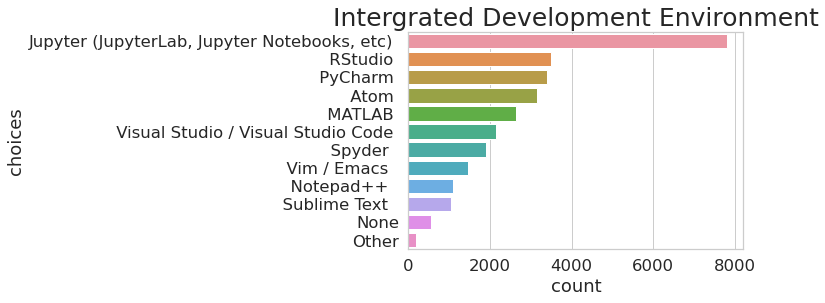

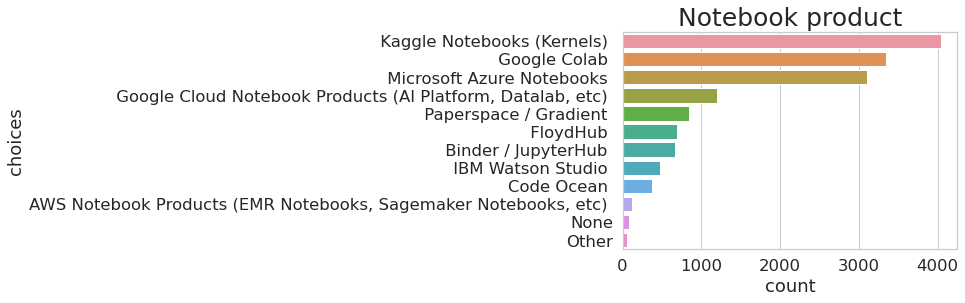

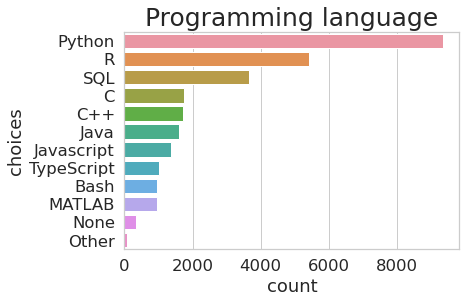

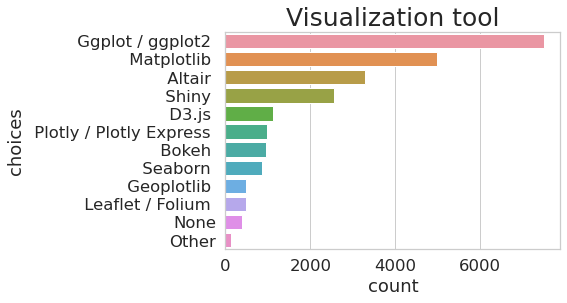

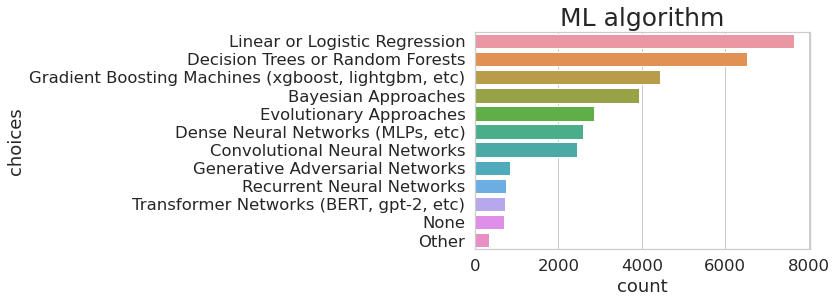

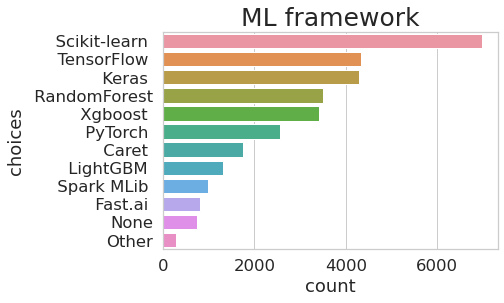

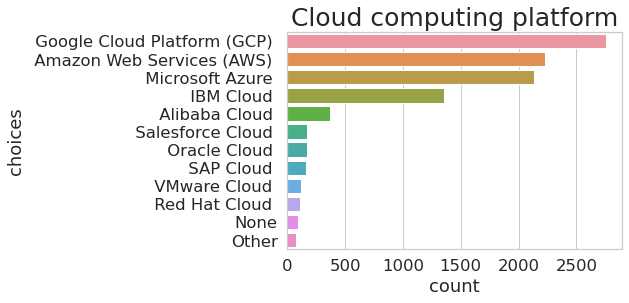

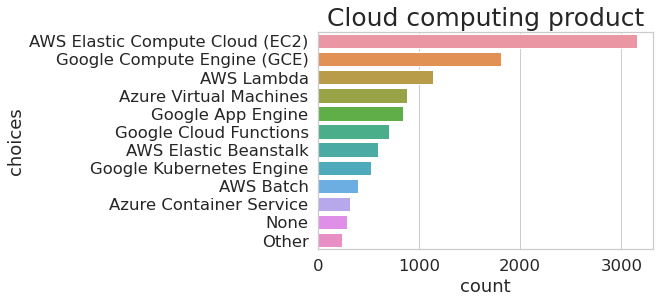

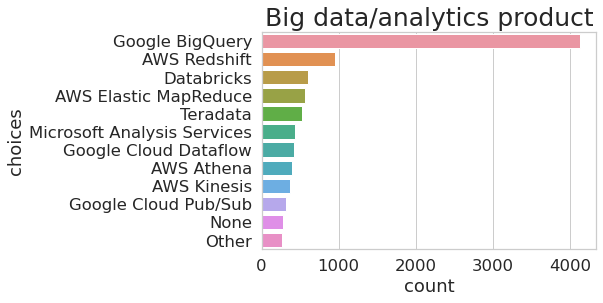

In [ ]:
import seaborn as sns

n = 0
for i in Qlist:
    dat = choice_rank(i)
    
    sns.set(font_scale = 1.5)
    sns.set_style("whitegrid")
    sns.barplot(data=dat,x='count',y='choices')
    plt.title(Qs[n],size=25)
    plt.show()
    
    n += 1

# 2. Online course websites

## (1) Coursera online courses

In [ ]:
# install wordcloud
!pip install wordcloud

In [ ]:
#For Text preprocessing
#!pip install gensim
from gensim.parsing.preprocessing import remove_stopwords

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import urllib
from bs4 import BeautifulSoup
import datetime
import ast
import csv
from os import path, getcwd
from IPython.display import HTML

%matplotlib inline

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

In [ ]:
import matplotlib.pyplot as plt
import math
import sklearn
import seaborn as sns
import nltk
import string
import re

from nltk.tokenize import word_tokenize 

#### Webscraping Code - Commented out and just read CSV after running once. 

In [ ]:
'''
coursesResults = []

for i in range(1,100):
    page = "https://www.coursera.org/courses?page=" +str(i) + "&index=prod_all_products_term_optimization"
    url = urllib.request.urlopen(page)
    content = url.read()
    soup = BeautifulSoup(content, 'lxml')
    
    courses = soup.findAll('li',{'class': 'ais-InfiniteHits-item'})
    
    for x in range(len(courses)):
        course = courses[x]
        link = 'https://www.coursera.org' + course.find('a').get('href')
        title = course.find('h2', {'class': 'color-primary-text card-title headline-1-text'}).get_text()
        
        if course.find('div', {'class': '_jen3vs _1d8rgfy3'}) != None:
            certification = course.find('div', {'class': '_jen3vs _1d8rgfy3'}).get_text()
            
        if course.find('span', {'class':'ratings-text'}) != None:
            rating = course.find('span', {'class':'ratings-text'}).get_text()
        
        if course.find('span', {'class':'enrollment-number'}) != None:
            numStudent = course.find('span', {'class':'enrollment-number'}).get_text()
        
        if course.find('span', {'class': 'difficulty'}) != None:
            diff = course.find('span', {'class': 'difficulty'}).get_text()
        
        
        course_url = urllib.request.urlopen(link)
        c_content = course_url.read()
        c_soup = BeautifulSoup(c_content, 'lxml')
        
        if c_soup.find('div',{'class': '_t6niqc3'}) != None:
            skills = c_soup.find('div',{'class': '_t6niqc3'}).get_text()
        
        coursesResults.append((
        title, certification, rating, numStudent, diff, link, skills
        ))
        
courseDF = pd.DataFrame(coursesResults, 
             columns=['title', 'certification', 'rating', 'numStudent', 'difficulty', 'link', 'skills'])
'''

'\ncoursesResults = []\n\nfor i in range(1,100):\n    page = "https://www.coursera.org/courses?page=" +str(i) + "&index=prod_all_products_term_optimization"\n    url = urllib.request.urlopen(page)\n    content = url.read()\n    soup = BeautifulSoup(content, \'lxml\')\n    \n    courses = soup.findAll(\'li\',{\'class\': \'ais-InfiniteHits-item\'})\n    \n    for x in range(len(courses)):\n        course = courses[x]\n        link = \'https://www.coursera.org\' + course.find(\'a\').get(\'href\')\n        title = course.find(\'h2\', {\'class\': \'color-primary-text card-title headline-1-text\'}).get_text()\n        \n        if course.find(\'div\', {\'class\': \'_jen3vs _1d8rgfy3\'}) != None:\n            certification = course.find(\'div\', {\'class\': \'_jen3vs _1d8rgfy3\'}).get_text()\n            \n        if course.find(\'span\', {\'class\':\'ratings-text\'}) != None:\n            rating = course.find(\'span\', {\'class\':\'ratings-text\'}).get_text()\n        \n        if course.fin

####  Read CSV after running Webscraping code to prevent re-running scraping 

In [ ]:
#courseDF.to_csv("Coursera")
df = pd.read_csv('Coursera.csv')

In [ ]:
df['skills'][0]

'DebuggingEncryption Algorithms and TechniquesCustomer ServiceNetwork ProtocolsCloud ComputingBinary CodeCustomer SupportLinuxTroubleshootingDomain Name System (DNS)Ipv4Network Model'

In [ ]:
#Convert enrollment strings to integers based on the last string where m - millions, k - thousands
#function for converting strings to ints
def convert(value):
    if value:
        # determine multiplier
        multiplier = 1
        if value.endswith('k'):
            multiplier = 1000
            value = value[0:len(value)-1] # strip multiplier character
        elif value.endswith('m'):
            multiplier = 1000000
            value = value[0:len(value)-1] # strip multiplier character

        # convert value to float, multiply, then convert the result to int
        return int(float(value) * multiplier)

    else:
        return 0


In [ ]:
#Convert enrollment numbers from scraped data to strings
df['numStudent'].unique()
Num_Enrolled = df['numStudent'].astype(str)

In [ ]:
# use a list comprehension to call the function on all values
Numbers = [convert(value) for value in Num_Enrolled]
#print(Numbers)
#Add Num of Enrolled students to new column of df
df['Enrolled'] = Numbers

In [ ]:
df['skills']

0      DebuggingEncryption Algorithms and TechniquesC...
1      Data ScienceStatistical AnalysisMachine Learni...
2      TensorflowConvolutional Neural NetworkArtifici...
3      Data ScienceRelational Database Management Sys...
4      Microsoft ExcelPython ProgrammingData Analysis...
                             ...                        
985    Computational NeuroscienceArtificial Neural Ne...
986    Network ProtocolsIp AddressWiresharkCommunicat...
987    EnergyEconomyNatural ResourcesEnvironmental Pr...
988    Data AnalysisAnalyticsMarketingMarketing Analy...
989    Data AnalysisAnalyticsMarketingMarketing Analy...
Name: skills, Length: 990, dtype: object

### Text pre-processing

In [ ]:
Keywords_token = [word_tokenize(i) for i in df['skills']]
Keywords_token

[['DebuggingEncryption',
  'Algorithms',
  'and',
  'TechniquesCustomer',
  'ServiceNetwork',
  'ProtocolsCloud',
  'ComputingBinary',
  'CodeCustomer',
  'SupportLinuxTroubleshootingDomain',
  'Name',
  'System',
  '(',
  'DNS',
  ')',
  'Ipv4Network',
  'Model'],
 ['Data',
  'ScienceStatistical',
  'AnalysisMachine',
  'LearningPython',
  'ProgrammingBusiness',
  'IntelligenceData',
  'AnalysisPandasNumpyCloud',
  'DatabasesIpythonRelational',
  'Database',
  'Management',
  'System',
  '(',
  'RDBMS',
  ')',
  'SQL'],
 ['TensorflowConvolutional',
  'Neural',
  'NetworkArtificial',
  'Neural',
  'NetworkDeep',
  'LearningBackpropagationPython',
  'ProgrammingHyperparameterHyperparameter',
  'OptimizationMachine',
  'LearningInductive',
  'TransferMulti-Task',
  'LearningFacial',
  'Recognition',
  'System'],
 ['Data',
  'ScienceRelational',
  'Database',
  'Management',
  'System',
  '(',
  'RDBMS',
  ')',
  'Cloud',
  'DatabasesPython',
  'ProgrammingSQLIpython'],
 ['Microsoft',
  '

#### Remove Punctuation

In [ ]:
remove = string.punctuation
#remove = remove.replace("#", "") # don't remove hyphens
pattern = r"[{}]".format(remove) # create the pattern
RemovePunct = lambda x: re.sub(pattern, "", x)

In [ ]:
KeyWords = df['skills'].apply(RemovePunct)
#KeyWords = list(map(RemovePunct, Keywords_token));

In [ ]:
SepStrings = lambda x: re.sub('((?<=[a-z])[A-Z])',r" \1", x)
Keywords = KeyWords.apply(SepStrings);

#### Tokenize words

In [ ]:
Keywords_token = [word_tokenize(i) for i in Keywords]

In [ ]:
Keywords_token

[['Debugging',
  'Encryption',
  'Algorithms',
  'and',
  'Techniques',
  'Customer',
  'Service',
  'Network',
  'Protocols',
  'Cloud',
  'Computing',
  'Binary',
  'Code',
  'Customer',
  'Support',
  'Linux',
  'Troubleshooting',
  'Domain',
  'Name',
  'System',
  'DNSIpv4Network',
  'Model'],
 ['Data',
  'Science',
  'Statistical',
  'Analysis',
  'Machine',
  'Learning',
  'Python',
  'Programming',
  'Business',
  'Intelligence',
  'Data',
  'Analysis',
  'Pandas',
  'Numpy',
  'Cloud',
  'Databases',
  'Ipython',
  'Relational',
  'Database',
  'Management',
  'System',
  'RDBMSSQL'],
 ['Tensorflow',
  'Convolutional',
  'Neural',
  'Network',
  'Artificial',
  'Neural',
  'Network',
  'Deep',
  'Learning',
  'Backpropagation',
  'Python',
  'Programming',
  'Hyperparameter',
  'Hyperparameter',
  'Optimization',
  'Machine',
  'Learning',
  'Inductive',
  'Transfer',
  'Multi',
  'Task',
  'Learning',
  'Facial',
  'Recognition',
  'System'],
 ['Data',
  'Science',
  'Relatio

In [ ]:
'''#finds all and seperates lower case followed by capital or capital followed by lowercase
SepStrings = lambda x: re.findall('((?<=[a-z])[A-Z]|[A-Z](?=[a-z]))', x)
New = list(map(SepStrings, LOS));'''

"#finds all and seperates lower case followed by capital or capital followed by lowercase\nSepStrings = lambda x: re.findall('((?<=[a-z])[A-Z]|[A-Z](?=[a-z]))', x)\nNew = list(map(SepStrings, LOS));"

In [ ]:
'''#DO NOT USE
#find only capital letters in string which are following lowercase letters
SepStrings = lambda x: re.findall('((?<=[a-z])[A-Z])', x)
New = list(map(SepStrings, LOS));'''

"#DO NOT USE\n#find only capital letters in string which are following lowercase letters\nSepStrings = lambda x: re.findall('((?<=[a-z])[A-Z])', x)\nNew = list(map(SepStrings, LOS));"

In [ ]:
#function to convert list to strings for inputting into Word Cloud
def listToString(s):  
    
    # initialize an empty string 
    str1 = ""  
    
    # traverse in the string   
    for ele in s:  
        str1 += ele   
    
    # return string   
    return str1 

In [ ]:
AllWords = []
for rows in Keywords_token:
    for words in rows:
        AllWords.append(words)
    

In [ ]:
len(AllWords)

15757

#### Count frequency of word occurences

In [ ]:
from collections import Counter
counts = Counter(AllWords)
#sorted(counts)

In [ ]:
#sorted(counts.items())
#sorted(counts.most_common())
#sorted(counts, key=counts.get, reverse=True)
word_freq_dict = sorted(counts.items(), key=lambda pair: pair[1], reverse=True)

In [ ]:
word_freq_dict

[('Data', 866),
 ('Learning', 603),
 ('Programming', 523),
 ('Analysis', 358),
 ('Machine', 353),
 ('Science', 347),
 ('Python', 342),
 ('Management', 316),
 ('Artificial', 244),
 ('Cloud', 238),
 ('Network', 237),
 ('System', 215),
 ('Intelligence', 188),
 ('Neural', 175),
 ('Deep', 175),
 ('Database', 159),
 ('Pandas', 158),
 ('Numpy', 158),
 ('Regression', 138),
 ('Analytics', 134),
 ('And', 129),
 ('Visualization', 124),
 ('Viz', 121),
 ('Architecture', 121),
 ('Algorithms', 120),
 ('Statistical', 120),
 ('Statistics', 120),
 ('Business', 116),
 ('Customer', 115),
 ('Jobs', 113),
 ('Hyperparameter', 106),
 ('Databases', 105),
 ('Relational', 105),
 ('Language', 89),
 ('and', 87),
 ('Leadership', 85),
 ('Marketing', 84),
 ('Computer', 82),
 ('Microsoft', 71),
 ('Excel', 71),
 ('Computing', 70),
 ('Model', 68),
 ('Testing', 68),
 ('Tensorflow', 67),
 ('Table', 65),
 ('Structure', 64),
 ('Optimization', 63),
 ('IT', 63),
 ('Innovation', 63),
 ('Debugging', 62),
 ('Technology', 62),
 (

In [ ]:
word_freq = pd.DataFrame(word_freq_dict, columns =['Word', 'Frequency'])

In [ ]:
#If required remove first row because it's a blank str
#word_freq = word_freq[1:]

In [ ]:
Top50 = word_freq.head(50)
Top50

,Word,Frequency
0,Data,866
1,Learning,603
2,Programming,523
3,Analysis,358
4,Machine,353
5,Science,347
6,Python,342
7,Management,316
8,Artificial,244
9,Cloud,238


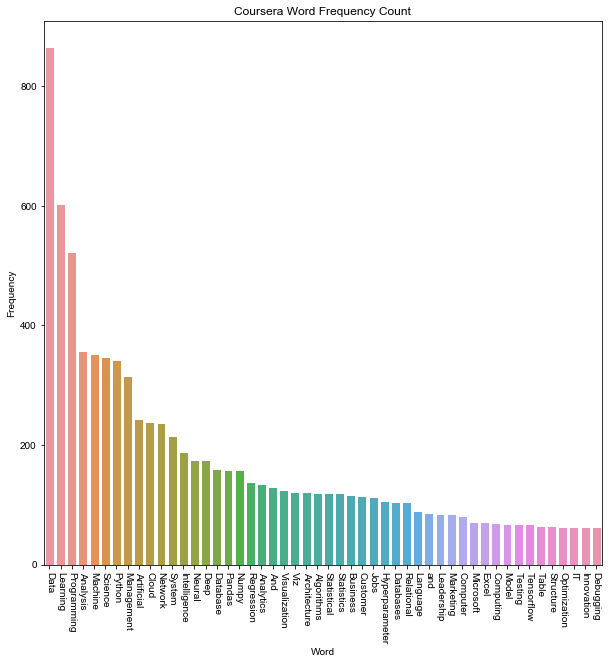

In [ ]:
#plt.figure(figsize=(15,10))
#ax = sns.histplot(data=Top50, x = 'Word', y = 'Frequency', bins = 50)
plt.figure(figsize=(10,10))
plt.xticks(rotation=-90)
plt.xlabel('skills')
plt.ylabel('Freq Count')
plt.title('Coursera Word Frequency Count')
sns.set_style('darkgrid')
ax = sns.barplot(x=Top50['Word'], y=Top50['Frequency'])

#plt.show()

### Generate WordCloud

In [ ]:
'''
# Python code to find frequency of each word 
def freq(str): 
    # break the string into list of words  
    str = str.split()          
    str2 = [] 
    # loop till string values present in list str 
    for i in str:              
        # checking for the duplicacy 
        if i not in str2: 
            # insert value in str2 
            str2.append(i)              
    for i in range(0, len(str2)): 
  
        # count the frequency of each word(present  
        # in str2) in str and print 
        print(str2[i], ':', str.count(str2[i]))
        
return str2



str = List
m = freq(str) 

'''

"\n# Python code to find frequency of each word \ndef freq(str): \n    # break the string into list of words  \n    str = str.split()          \n    str2 = [] \n    # loop till string values present in list str \n    for i in str:              \n        # checking for the duplicacy \n        if i not in str2: \n            # insert value in str2 \n            str2.append(i)              \n    for i in range(0, len(str2)): \n  \n        # count the frequency of each word(present  \n        # in str2) in str and print \n        print(str2[i], ':', str.count(str2[i]))\n        \nreturn str2\n\n\n\nstr = List\nm = freq(str) \n\n"

In [ ]:
#Combine list of strings into one string using join function 
separator = ' '
List = separator.join(AllWords)

In [ ]:
stopwords = set(STOPWORDS)
# instantiate a word cloud object
Coursera_Skills = WordCloud(width = 800, height = 800, 
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

# generate the word cloud
Coursera_Skills.generate(List)

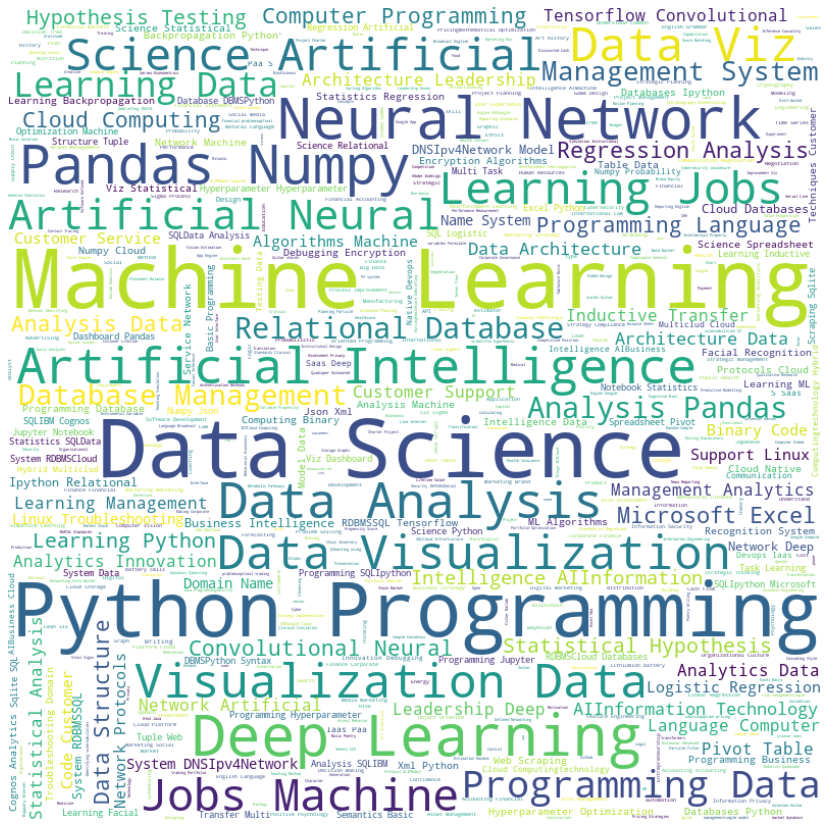

In [ ]:
import matplotlib.pyplot as plt
# display the word cloud
plt.figure(figsize=(15,15))
plt.imshow(Coursera_Skills, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
df['title']

0                                      Google IT Support
1                                       IBM Data Science
2                                          Deep Learning
3                           Introduction to Data Science
4                                       IBM Data Analyst
                             ...                        
985                           Computational Neuroscience
986                               Introduction to TCP/IP
987    Municipal Solid Waste Management in Developing...
988                 Applying Data Analytics in Marketing
989             International migrations: a global issue
Name: title, Length: 990, dtype: object

In [ ]:
Relevant = []

for i in range(0,len(df['skills'])):
    for j in df['skills'][i]:
        if any(match in j for match in Top50['Word']):
            skill_match = df['title'].iloc[i]
            Relevant.append(skill_match)
 


#### Alternate Word Frequencies

In [ ]:
import re
import nltk

nltk.download('stopwords')
nltk.download('wordnet')

from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\SBarr\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\SBarr\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
# Create a list of stop words from nltk
stop_words = set(stopwords.words("english"))
print(sorted(stop_words))

['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further', 'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven', "haven't", 'having', 'he', 'her', 'here', 'hers', 'herself', 'him', 'himself', 'his', 'how', 'i', 'if', 'in', 'into', 'is', 'isn', "isn't", 'it', "it's", 'its', 'itself', 'just', 'll', 'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn', "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not', 'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'other', 'our', 'ours', 'ourselves', 'out', 'over', 'own', 're', 's', 'same', 'shan', "shan't", 'she', "she's", 'should', "should've", 'shouldn', "shouldn't", 'so', 'some',

In [ ]:
# Tokenize the text and build a vocabulary of known words
from sklearn.feature_extraction.text import CountVectorizer
import re
# initialize the count vectorizer 
cv=CountVectorizer(max_df=0.8,stop_words=stop_words, max_features=10000, ngram_range=(1,3))
# fit it to corpus 
X=cv.fit_transform(Keywords)

         Keyword  Frequency
0           data        875
1       learning        605
2    programming        526
3       analysis        361
4        machine        353
5        science        347
6         python        342
7     management        320
8     artificial        244
9        network        238
10         cloud        238
11        system        220
12           and        216
13  intelligence        190
14        neural        175
15          deep        175
16      database        159
17        pandas        158
18         numpy        158
19    regression        139


[Text(0, 0, 'data'),
 Text(0, 0, 'learning'),
 Text(0, 0, 'programming'),
 Text(0, 0, 'analysis'),
 Text(0, 0, 'machine'),
 Text(0, 0, 'science'),
 Text(0, 0, 'python'),
 Text(0, 0, 'management'),
 Text(0, 0, 'artificial'),
 Text(0, 0, 'network'),
 Text(0, 0, 'cloud'),
 Text(0, 0, 'system'),
 Text(0, 0, 'and'),
 Text(0, 0, 'intelligence'),
 Text(0, 0, 'neural'),
 Text(0, 0, 'deep'),
 Text(0, 0, 'database'),
 Text(0, 0, 'pandas'),
 Text(0, 0, 'numpy'),
 Text(0, 0, 'regression')]

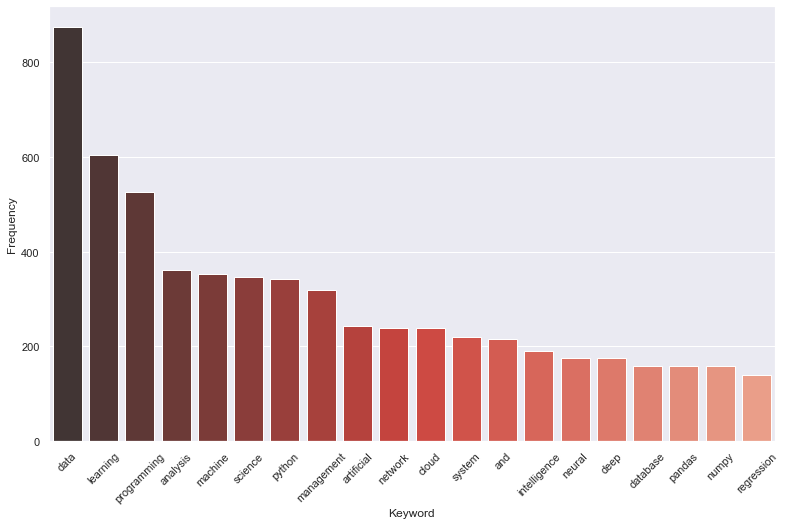

In [ ]:
# View most frequently occuring keywords
def get_top_n_words(Keywords, n=None):
    vec = CountVectorizer().fit(Keywords)
    bag_of_words = vec.transform(Keywords)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in      
                   vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                       reverse=True)
    return words_freq[:n]

# Convert most freq words to dataframe for plotting bar plot, save as CSV
top_words = get_top_n_words(Keywords, n=20)
top_df = pd.DataFrame(top_words)
top_df.columns=["Keyword", "Frequency"]
print(top_df)
#top_df.to_csv(file_prefix + '_top_words.csv')

# Barplot of most freq words
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
g = sns.barplot(x="Keyword", y="Frequency", data=top_df, palette="Reds_d")
g.set_xticklabels(g.get_xticklabels(), rotation=45)
#g.figure.savefig(file_prefix + "_keyword.png", bbox_inches = "tight")

                    Bi-gram  Frequency
0          machine learning        350
1              data science        338
2        python programming        338
3             deep learning        174
4            neural network        172
5              pandas numpy        157
6   artificial intelligence        134
7             data analysis        133
8        data visualization        122
9        visualization data        121
10                 data viz        121
11       science artificial        113
12            learning jobs        112
13             jobs machine        111
14        artificial neural        110
15         programming data        106
16          analysis pandas        105
17      relational database        105
18      database management        105
19        management system        105


[Text(0, 0, 'machine learning'),
 Text(0, 0, 'data science'),
 Text(0, 0, 'python programming'),
 Text(0, 0, 'deep learning'),
 Text(0, 0, 'neural network'),
 Text(0, 0, 'pandas numpy'),
 Text(0, 0, 'artificial intelligence'),
 Text(0, 0, 'data analysis'),
 Text(0, 0, 'data visualization'),
 Text(0, 0, 'visualization data'),
 Text(0, 0, 'data viz'),
 Text(0, 0, 'science artificial'),
 Text(0, 0, 'learning jobs'),
 Text(0, 0, 'jobs machine'),
 Text(0, 0, 'artificial neural'),
 Text(0, 0, 'programming data'),
 Text(0, 0, 'analysis pandas'),
 Text(0, 0, 'relational database'),
 Text(0, 0, 'database management'),
 Text(0, 0, 'management system')]

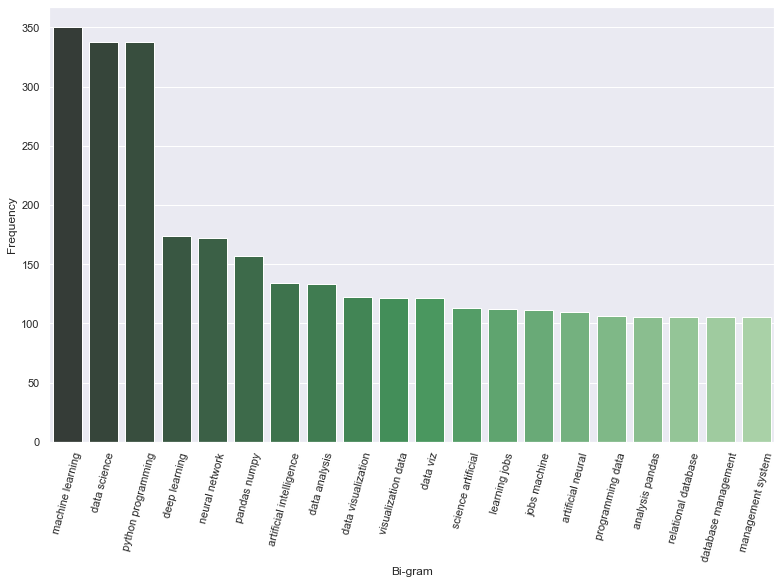

In [ ]:
def get_top_n2_words(Keywords, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2),  
            max_features=2000).fit(Keywords)
    bag_of_words = vec1.transform(Keywords)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

# Convert most freq bigrams to dataframe for plotting bar plot, save as CSV
top2_words = get_top_n2_words(Keywords, n=20)
top2_df = pd.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Frequency"]
print(top2_df)
#top2_df.to_csv(file_prefix + '_bigrams.csv')

# Barplot of most freq Bi-grams
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
h=sns.barplot(x="Bi-gram", y="Frequency", data=top2_df, palette="Greens_d")
h.set_xticklabels(h.get_xticklabels(), rotation=75)
#h.figure.savefig(file_prefix + "_bi-gram.png", bbox_inches = "tight")

## (2) DataCamp online courses

In [ ]:
!pip install numpy
!pip install pandas
!pip install bs4
!pip install ast
!pip install matplotlib
!pip install openpyxl  # for writing to excel
!pip install lxml

    ERROR: Complete output from command python setup.py egg_info:
    ERROR: Traceback (most recent call last):
      File "<string>", line 1, in <module>
      File "/tmp/pip-install-du5ldyjk/ast/setup.py", line 6, in <module>
        README = codecs.open(os.path.join(here, 'AST/README'), encoding='utf8').read()
      File "/home/jupyterlab/conda/envs/python/lib/python3.6/codecs.py", line 897, in open
        file = builtins.open(filename, mode, buffering)
    FileNotFoundError: [Errno 2] No such file or directory: '/tmp/pip-install-du5ldyjk/ast/AST/README'
    ----------------------------------------
ERROR: Command "python setup.py egg_info" failed with error code 1 in /tmp/pip-install-du5ldyjk/ast/
     |████████████████████████████████| 245kB 4.8MB/s eta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/2a/77/35/0da0965a057698121fc7d8c5a7a9955cdbfb3cc4e2423cad39
Successfully built et-xmlfile


In [ ]:
!pip install nltk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import urllib
from bs4 import BeautifulSoup
import datetime
import ast
import csv
from IPython.display import HTML
import nltk
from nltk.tokenize import TweetTokenizer

%matplotlib inline

In [ ]:
## create a loop that will loop through courses of all topics
## different topics of courses have different links
'''
links = ['https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Data+Engineering',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Programming',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Importing+%26+Cleaning+Data',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Data+Manipulation',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Data+Visualization',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Probability+%26+Statistics',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Machine+Learning',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Applied+Finance',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Reporting',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Case+Studies',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Management',
         'https://www.datacamp.com/search?utf8=%E2%9C%93&q=&tab=courses&facets%5Btopic%5D%5B%5D=Other']

coursesResults = []

# loop through each topics of courses
cnt = 0
for i in links:
    cnt = cnt + 1
    url = urllib.request.urlopen(i)
    content = url.read()
    soup = BeautifulSoup(content, 'lxml')
    courses_data = soup.findAll('article',{'class': 'dc-card dc-card--bordered dc-card--interactive dc-global-search-result'})
    
    # loop through each course under the same topic
    for x in range(len(courses_data)):
        course = courses_data[x]
        name = course.find(class_ = 'dc-global-search-result__content').h4.get_text()
        description = course.find(class_ = 'dc-u-mv-8').get_text().replace('\n', '').replace('  ','')
        length = course.find(class_ = 'dc-u-fs-small').get_text()[7:18].replace('\n', '')
        
        # topic taken length differe according to the topics
        if (cnt == 2) or (cnt == 9) or (cnt == 11) or (cnt == 12):
            topic = course.find(class_ = 'dc-u-fs-small').get_text()[22:35].replace('\n', '').replace(',','')
        elif (cnt == 10):
            topic = course.find(class_ = 'dc-u-fs-small').get_text()[22:37].replace('\n', '').replace(',','')
        elif (cnt == 8):
            topic = course.find(class_ = 'dc-u-fs-small').get_text()[22:40].replace('\n', '').replace(',','')
        elif (cnt == 1) or (cnt == 4) or (cnt == 5) or (cnt == 7):
            topic = course.find(class_ = 'dc-u-fs-small').get_text()[22:43].replace('\n', '').replace(',','')
        else:
            topic = course.find(class_ = 'dc-u-fs-small').get_text()[22:50].replace('\n', '').replace(',','')
        
        # course or project
        if length.endswith('minutes'): # would be project
            style = course.find(class_= 'dc-u-fs-small').get_text().replace('  ','')[-20:-10].replace('\n','')
        else:  # would be course
            style = course.find(class_= 'dc-u-fs-small').get_text()[-10:].replace('\n','')
        
        # based on style, find link under different classes
        if style == 'Course':
            link = 'https://www.datacamp.com' + course.find(class_= 'shim ds-snowplow-search-v2-result-course').get('href')
        else:
            link = 'https://www.datacamp.com' + course.find(class_= 'shim ds-snowplow-search-v2-result-project').get('href')
            
        ### go in the course links to read more info
        course_url = urllib.request.urlopen(link)
        course_content = course_url.read()
        course_soup = BeautifulSoup(course_content, 'lxml')
        NumofLearner = course_soup.findAll('span',{'class': 'css-1enfl6p'})
        
        if style == 'Course':
            Sub = course_soup.findAll('h3',{'class': 'css-1kgx1cu'})
        else:
            Sub = course_soup.findAll('div',{'class': 'css-1wedgid'})
        
        # get number of learners in each course
        NumLearners = "NaN"
        for i in range(len(NumofLearner)):
            if NumofLearner[i].get_text().endswith('Learners'):
                NumLearners = NumofLearner[i].get_text()[:-9]
        
        # get the title of sub-steps within each course/project
        sublist = []
        for i in range(len(Sub)):
            sublist.append(Sub[i].get_text())

        coursesResults.append((
                topic, style, name, description, length, NumLearners, sublist, link
                ))
'''

In [ ]:
import openpyxl
'''
courseDF = pd.DataFrame(coursesResults, 
             columns=['topic','style','name','description','length','NumLearners','SubElements','link'])
courseDF.to_excel("DataCamp_webScraping.xlsx")
#courseDF.to_csv("DataCamp_webScraping.csv")
'''

### Compute wordclouds for course names under each course topic

In [ ]:
!pip install wordcloud
from wordcloud import WordCloud, STOPWORDS

     |████████████████████████████████| 368kB 12.0MB/s eta 0:00:01     |█████████▉                      | 112kB 12.0MB/s eta 0:00:01


In [ ]:
# read in excel file
courseDF = pd.read_excel("DataCamp_webScraping.xlsx")

In [ ]:
courseDF.head(3)

,Unnamed: 0,topic,style,name,description,length,NumLearners,SubElements,link
0,0,Data Engineering,Course,Data Engineering for Everyone,Discover how data engineers lay the groundwork...,2 hours,"26,491","['What is data engineering?', 'Storing data', ...",https://www.datacamp.com/courses/data-engineer...
1,1,Data Engineering,Course,Introduction to Data Engineering,Learn about the world of data engineering with...,4 hours,"44,668","['Introduction to Data Engineering', 'Data eng...",https://www.datacamp.com/courses/introduction-...
2,2,Data Engineering,Course,Database Design,Learn to design databases in SQL.,4 hours,"14,145","['Processing, Storing, and Organizing Data', '...",https://www.datacamp.com/courses/database-design


In [ ]:
# separate data based on topic
topics = list(courseDF['topic'].unique())
courseDF['topic'].unique()

array(['Data Engineering', 'Programming', 'Importing & Cleaning Data',
       'Data Manipulation', 'Data Visualization',
       'Probability & Statistics', 'Machine Learning', 'Applied Finance',
       'Reporting', 'Case Studies', 'Management', 'Other'], dtype=object)

In [ ]:
DataEng = (courseDF[courseDF['topic'] == topics[0]]).reset_index(drop=True)
Programming = (courseDF[courseDF['topic'] == topics[1]]).reset_index(drop=True)
ImportCleanData = (courseDF[courseDF['topic'] == topics[2]]).reset_index(drop=True)
DataMani = (courseDF[courseDF['topic'] == topics[3]]).reset_index(drop=True)
DataVis = (courseDF[courseDF['topic'] == topics[4]]).reset_index(drop=True)
ProbStat = (courseDF[courseDF['topic'] == topics[5]]).reset_index(drop=True)
ML = (courseDF[courseDF['topic'] == topics[6]]).reset_index(drop=True)
AppliedFinance = (courseDF[courseDF['topic'] == topics[7]]).reset_index(drop=True)
Reporting = (courseDF[courseDF['topic'] == topics[8]]).reset_index(drop=True)
CaseStudies = (courseDF[courseDF['topic'] == topics[9]]).reset_index(drop=True)
Management = (courseDF[courseDF['topic'] == topics[10]]).reset_index(drop=True)
Other = (courseDF[courseDF['topic'] == topics[11]]).reset_index(drop=True)


In [ ]:
# add stop words to remove
STOPWORDS.update(['Introduction','Intermediate','Data','data','introduction','intermediate',
                 'putting','dates','basket'])

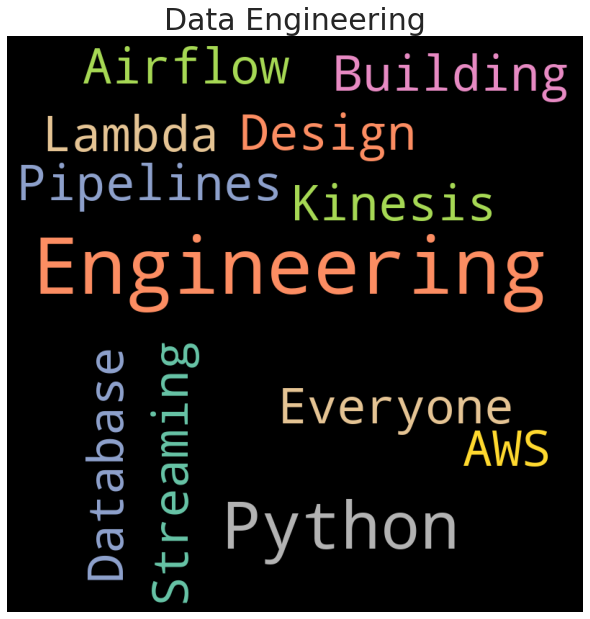

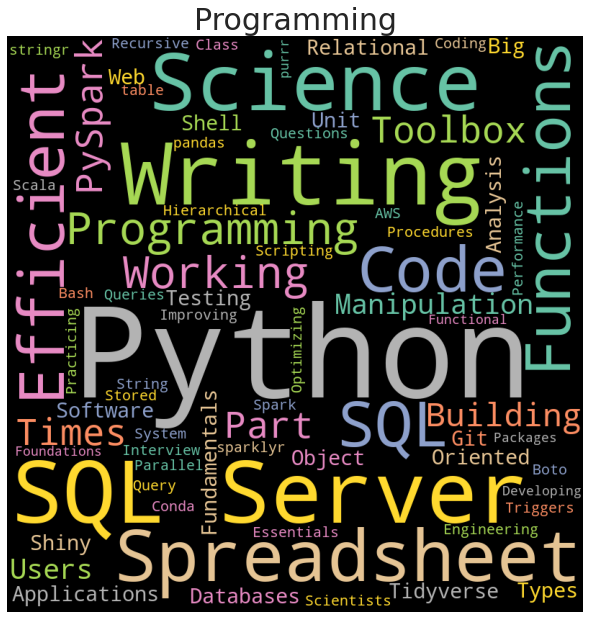

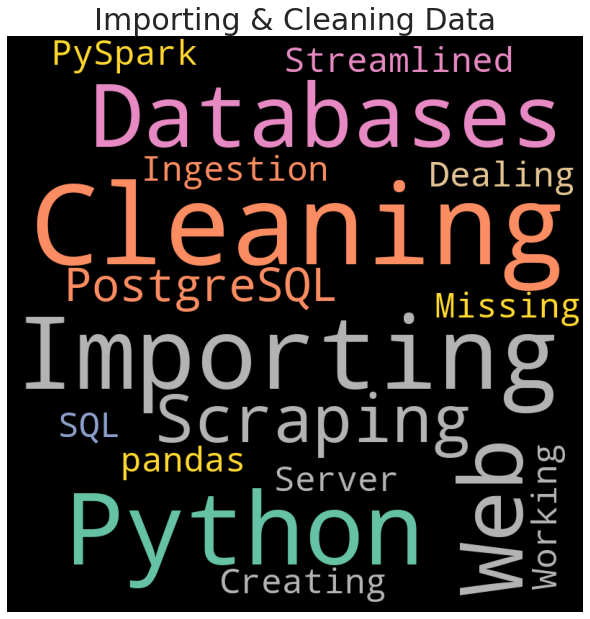

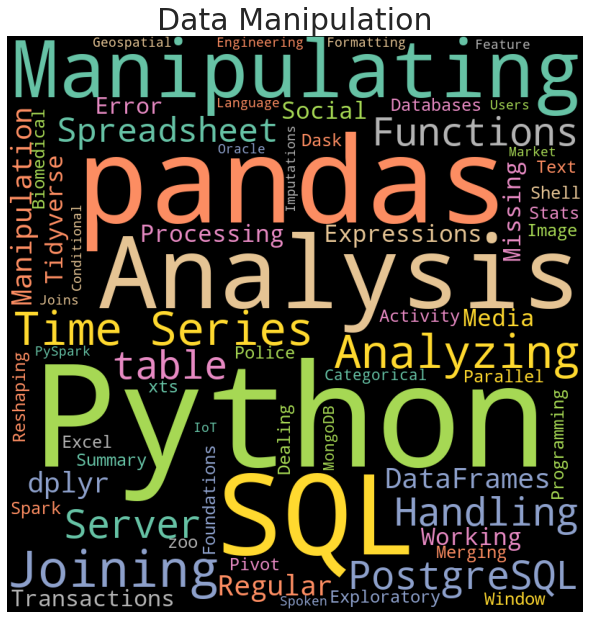

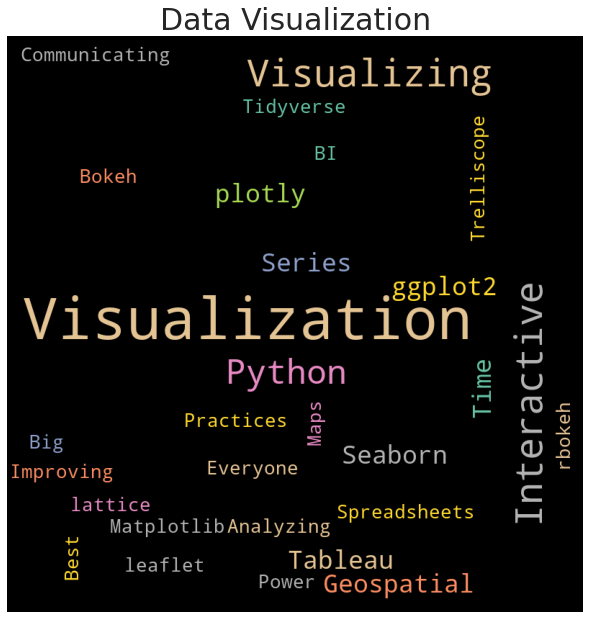

...

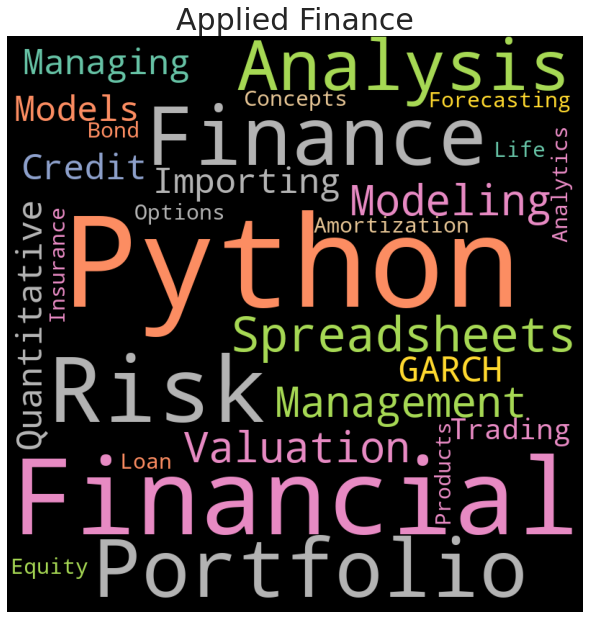

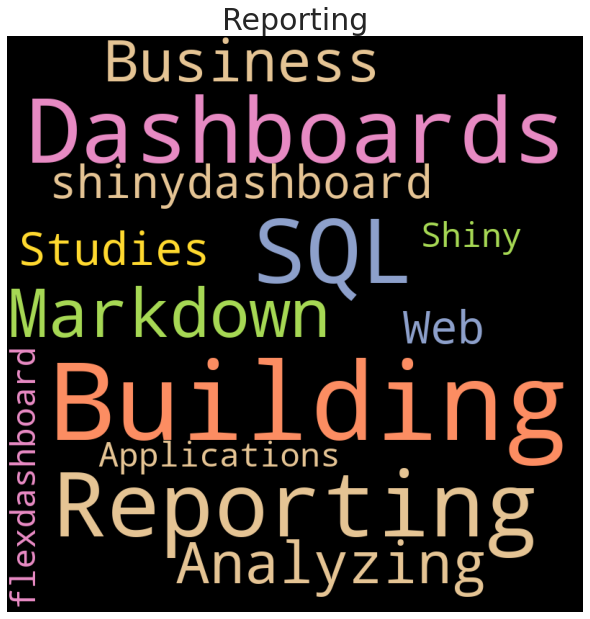

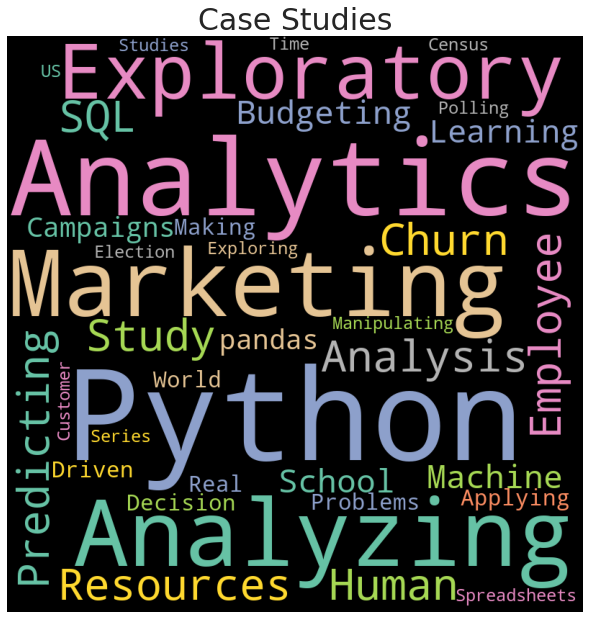

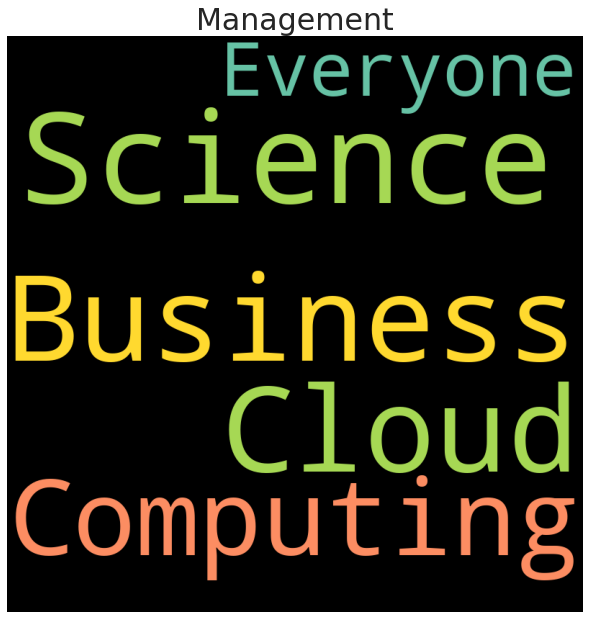

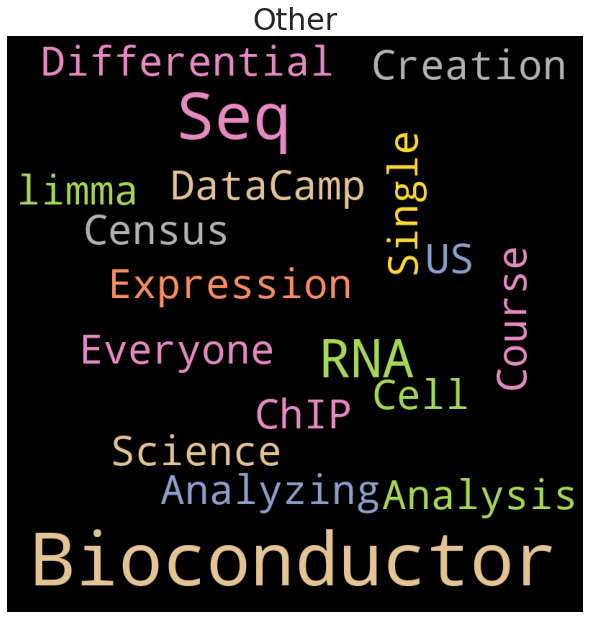

In [ ]:
dfs = [DataEng, Programming, ImportCleanData, DataMani, DataVis, ProbStat, ML, AppliedFinance, Reporting,
      CaseStudies, Management, Other]

n = 0

for i in dfs:
    text = ''
    courses = i[(i['style'] == 'Course')]
    text += " ".join(courses['name'])
    
    #text += " ".join(courseDF['name'][i]) + " "
    wordcloud = WordCloud(width = 800, height = 800,background_color='black', stopwords = STOPWORDS,
                      colormap='Set2', collocations=True,min_font_size = 10).generate(text)
    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0)
    plt.title(topics[n], size = 30)
  
    plt.show()
    
    n += 1
    



### Compute wordclouds for subcourse elements under each course topic

In [ ]:
import string
punctuations = list(string.punctuation)

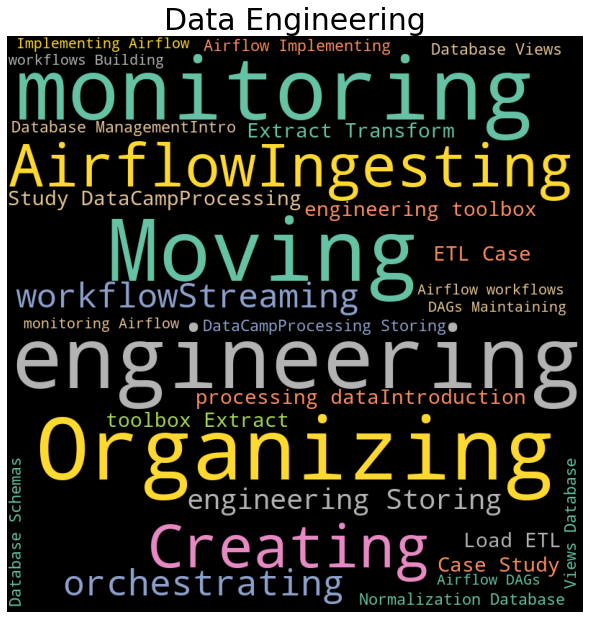

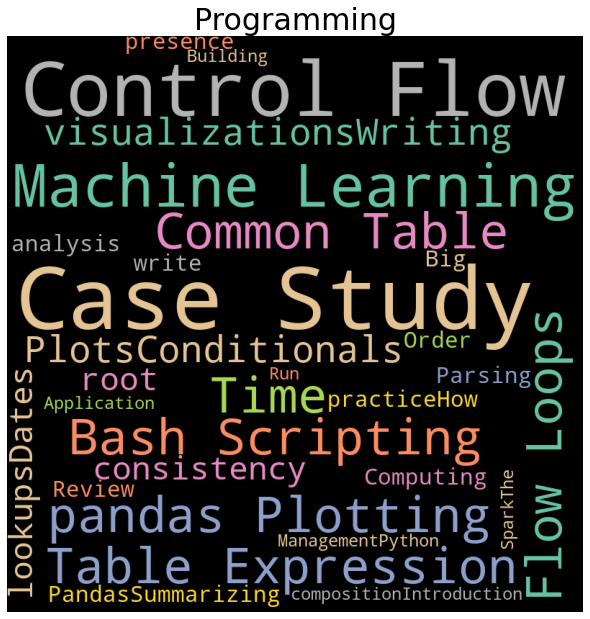

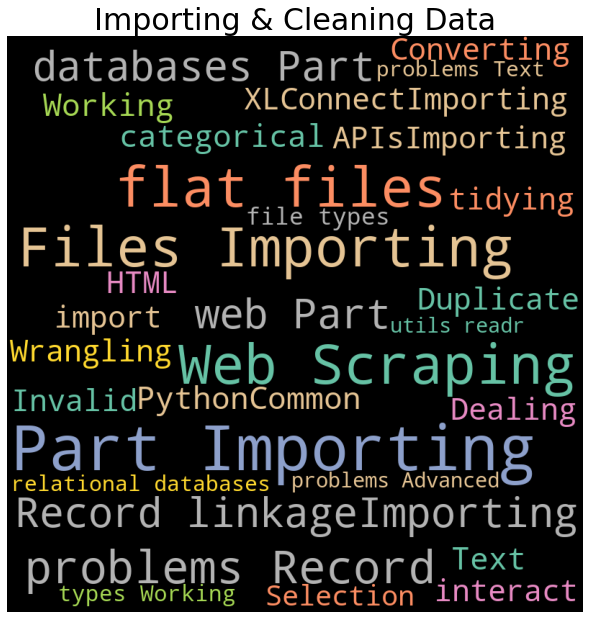

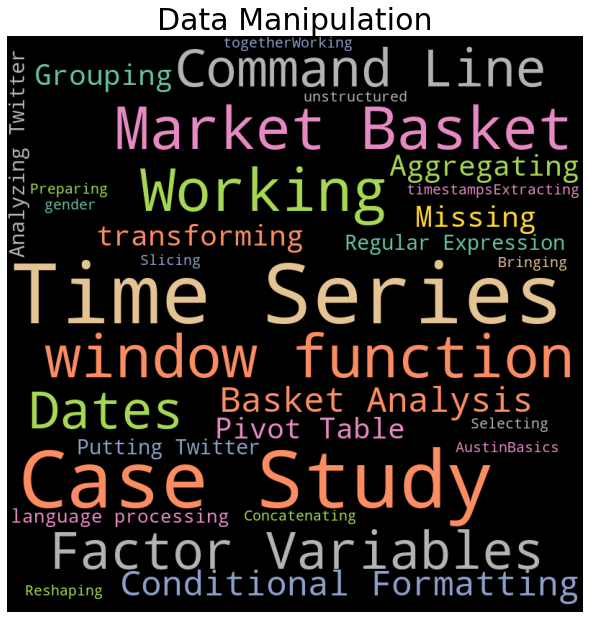

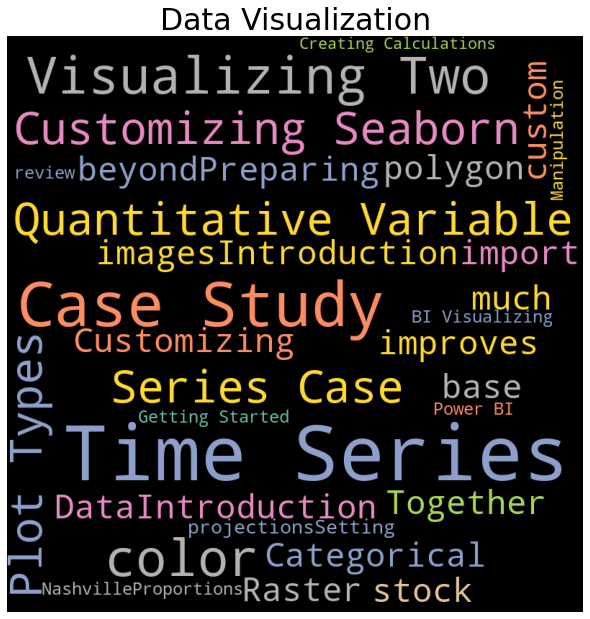

...

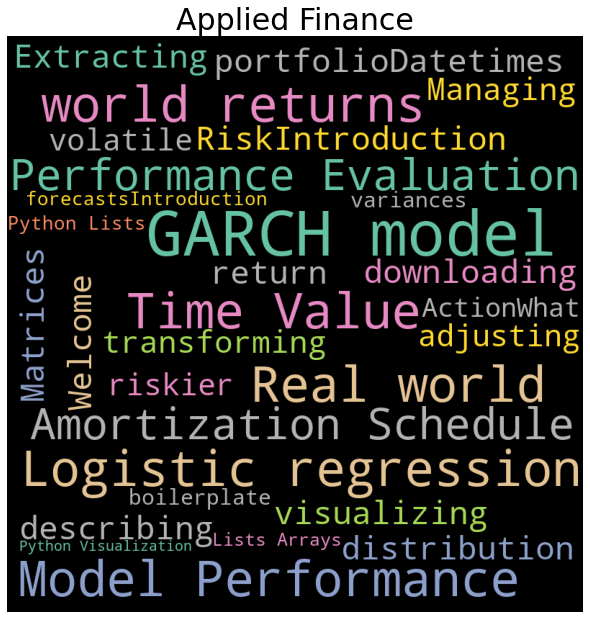

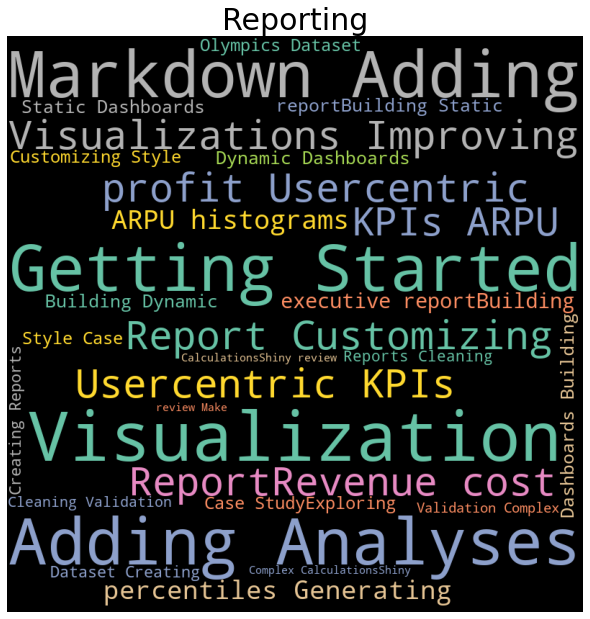

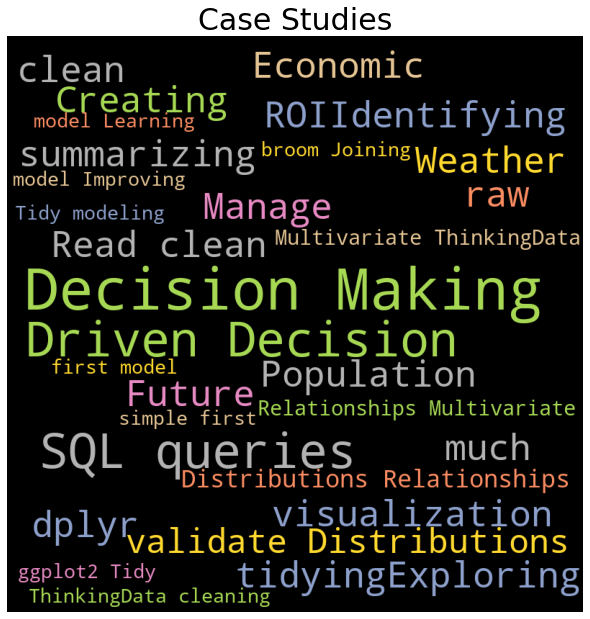

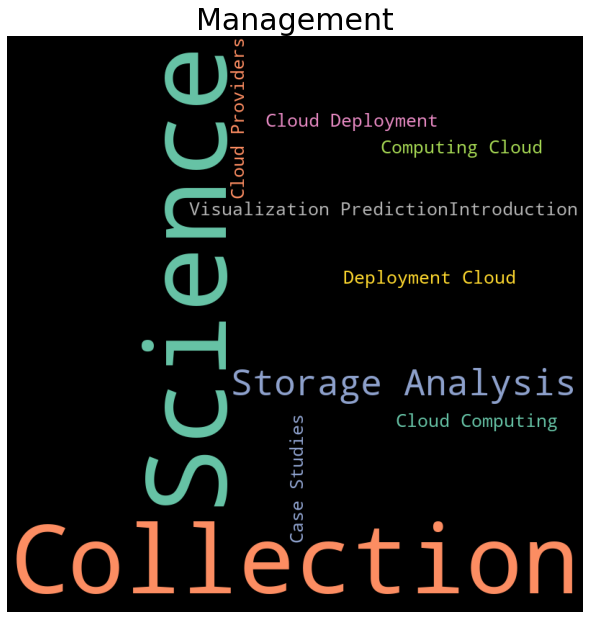

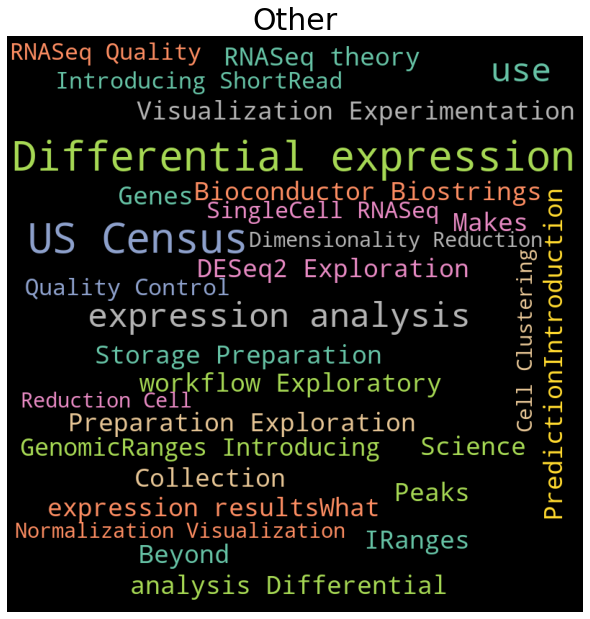

In [ ]:
n = 0
for i in dfs:
    text = ''
    courses = i[(i['style'] == 'Course')]
    for i in range(len(courses['SubElements'])):
        text += ''.join([t for t in courses['SubElements'][i] if not t in punctuations])
    
    wordcloud = WordCloud(width = 800, height = 800,background_color='black', stopwords = STOPWORDS,
                      colormap='Set2', collocations=True, collocation_threshold=3,min_font_size = 10,max_words=30).generate(text)
    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0)
    plt.title(topics[n], size = 30)
  
    plt.show()
    
    n += 1

### Top words with the highest frequencies in course names under each topics

In [1]:
from sklearn.feature_extraction.text import CountVectorizer


In [2]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(ngram_range=(1,2),stop_words = STOPWORDS).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in      
                   vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                       reverse=True)
    return words_freq[:n]

In [3]:
def get_top_n_bigrams(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2,2),stop_words = STOPWORDS).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in      
                   vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                       reverse=True)
    return words_freq[:n]

In [4]:
import seaborn as sns

In [ ]:
n = 0

for i in dfs:
    text = ''
    courses = i[(i['style'] == 'Course')]
    text += " ".join(courses['name'])
    text = [text]
    top_words = get_top_n_words(text, n = 20)
    top_df = pd.DataFrame(top_words)
    top_df.columns=["Word", "Freq"]
    #Barplot of most freq words
    sns.set(rc={'figure.figsize':(13,8)})
    g = sns.barplot(x="Word", y="Freq", data=top_df)
    g.set_xticklabels(g.get_xticklabels(), rotation=30)
    plt.title(topics[n], size = 30)
    plt.show()
    
    print(top_words)
    
    n += 1
    
    
    
    

### Top words with the highest frequencies in subcourse elements under each topics

In [ ]:
n = 0
for i in dfs:
    text = ''
    courses = i[(i['style'] == 'Course')]
    for i in range(len(courses['SubElements'])):
        text += ''.join([t for t in courses['SubElements'][i] if not t in punctuations])
    
    text = [text]
    top_words = get_top_n_words(text, n = 20)
    top_df = pd.DataFrame(top_words)
    top_df.columns=["Word", "Freq"]
    #Barplot of most freq words
    sns.set(rc={'figure.figsize':(13,8)})
    g = sns.barplot(x="Word", y="Freq", data=top_df)
    g.set_xticklabels(g.get_xticklabels(), rotation=30)
    plt.title(topics[n], size = 30)
    plt.show()
    
    print(top_words)
    
    n += 1

### Most popular courses

In [ ]:
# filter out NaN learner
df = courseDF.dropna(subset=['NumLearners']).reset_index(drop = True)
# put num of learner into intergers
for i in range(len(df)):
    if type(df.loc[i, 'NumLearners']) == str:
        df.loc[i, 'NumLearners'] = df.loc[i, 'NumLearners'].replace(',','')
    df.loc[i, 'NumLearners'] = int(df.loc[i, 'NumLearners'])
    

In [ ]:
sorted_df = df[df['style'] == 'Course'].sort_values(by=['NumLearners'], ascending = False)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  after removing the cwd from sys.path.


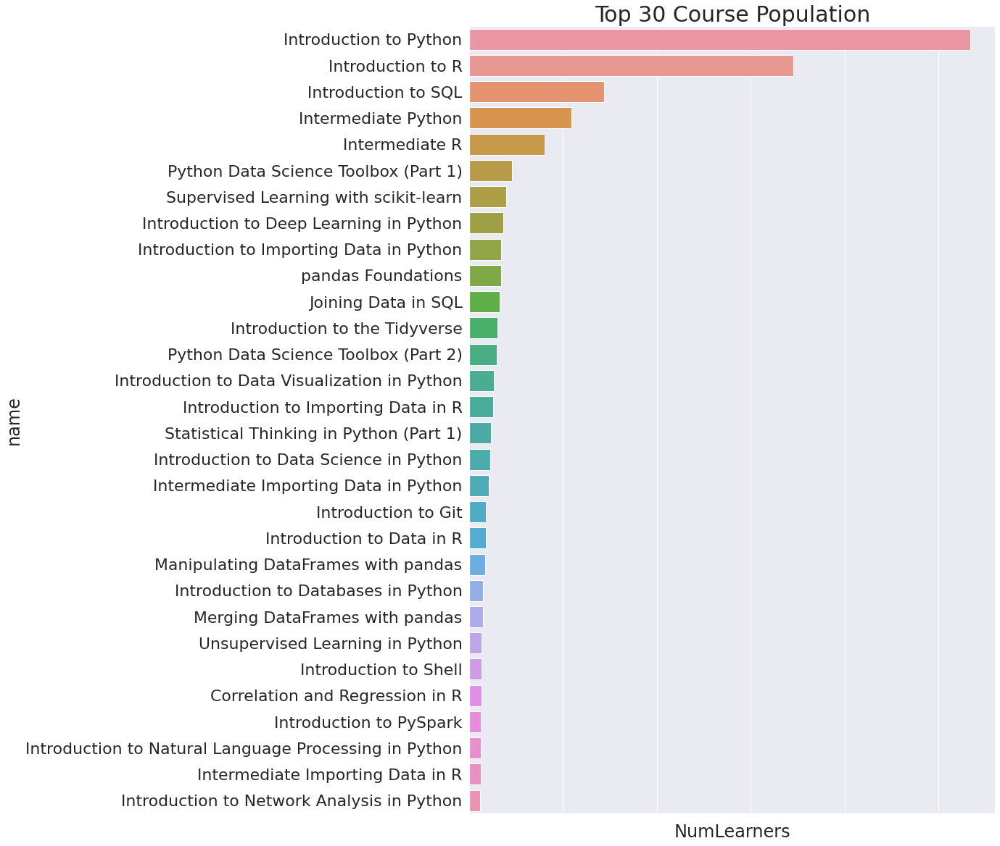

In [ ]:
sns.set(rc={'figure.figsize':(13,20)})
sns.set(font_scale = 2)
g = sns.barplot(x="NumLearners", y="name",  data=sorted_df[0:30])
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.title('Top 30 Course Population', size = 30)
plt.show()

### Most popular course topics

In [ ]:
df = df.drop(['Unnamed: 0'],axis =1)

In [ ]:
df['NumLearners'] = pd.to_numeric(df['NumLearners'])

In [ ]:
topic_pop = pd.DataFrame(df.groupby('topic').sum().reset_index())

In [ ]:
topic_pop = topic_pop.sort_values('NumLearners', ascending = False).reset_index(drop = True)

In [ ]:
topic_pop

,topic,NumLearners
0,Programming,7586561
1,Machine Learning,1248243
2,Data Manipulation,1167300
3,Probability & Statistics,967876
4,Importing & Cleaning Data,666252
5,Data Visualization,665970
6,Case Studies,408519
7,Applied Finance,333859
8,Data Engineering,99998
9,Other,77427


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  after removing the cwd from sys.path.


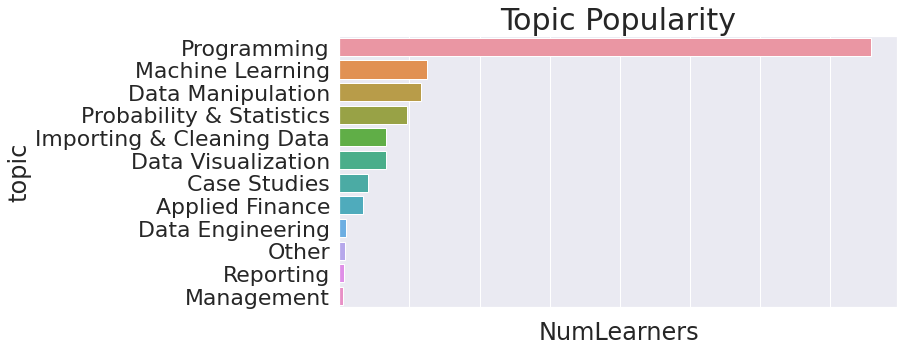

In [ ]:
sns.set(rc={'figure.figsize':(10,5)})
sns.set(font_scale = 2)
g = sns.barplot(x="NumLearners", y="topic",  data=topic_pop)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.title('Topic Popularity', size = 30)
plt.show()

### Course popularity within each topic

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  del sys.path[0]


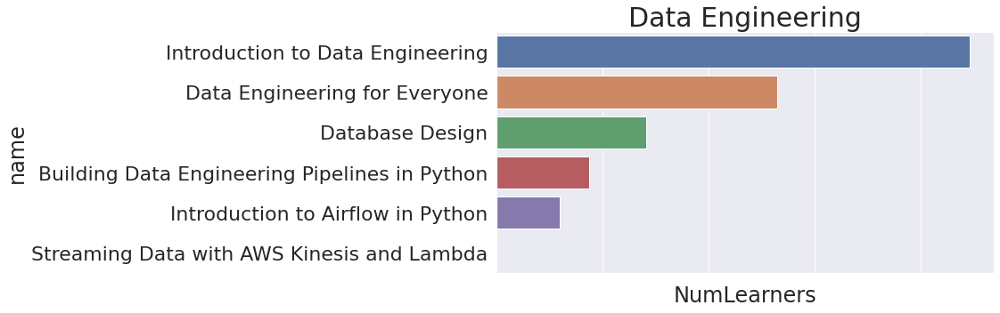

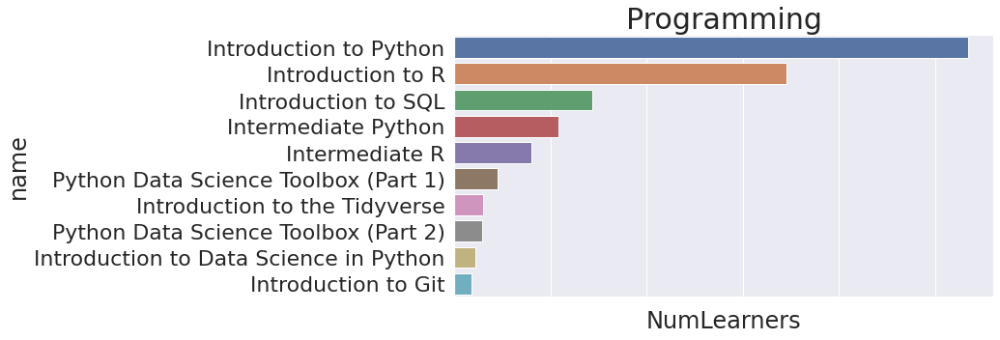

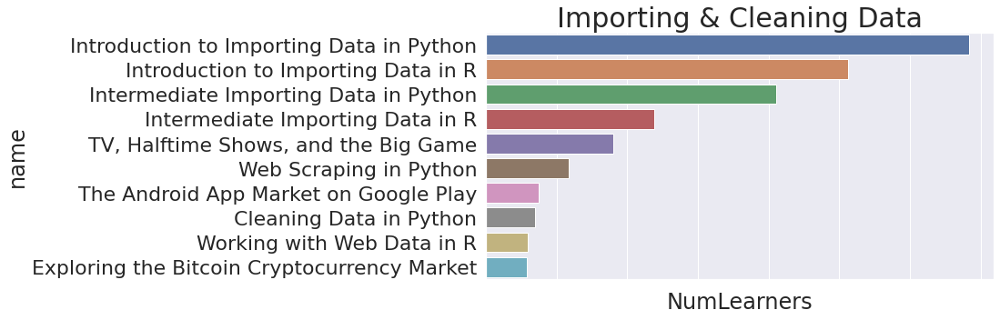

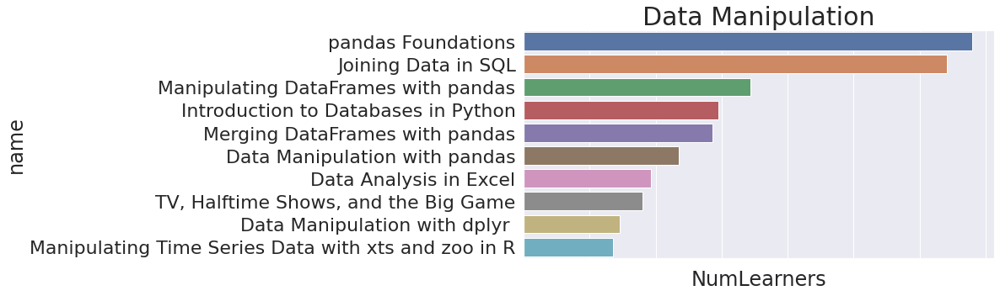

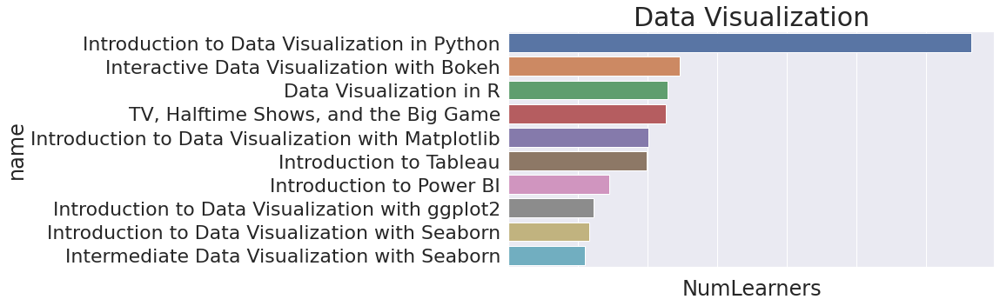

...

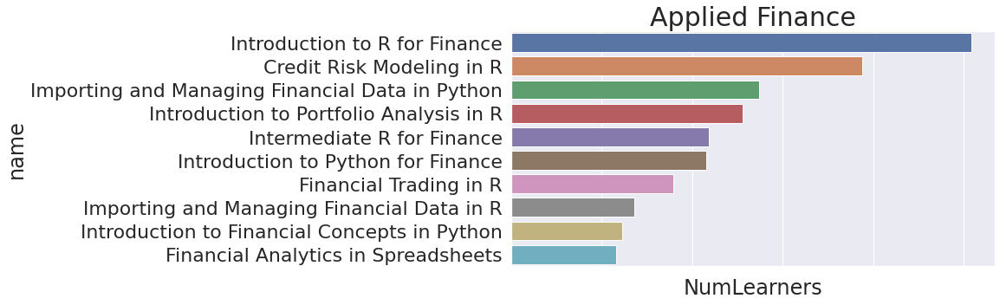

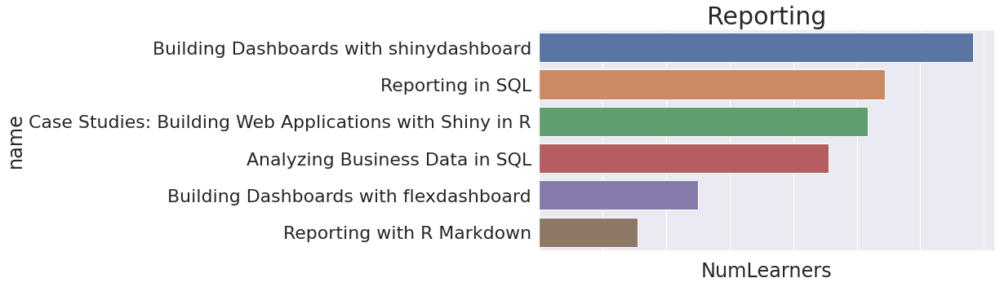

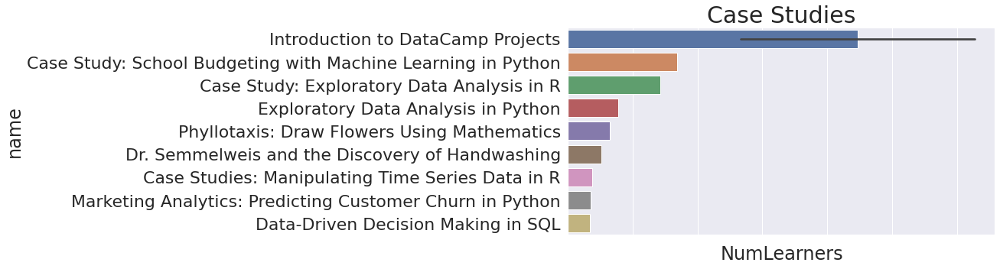

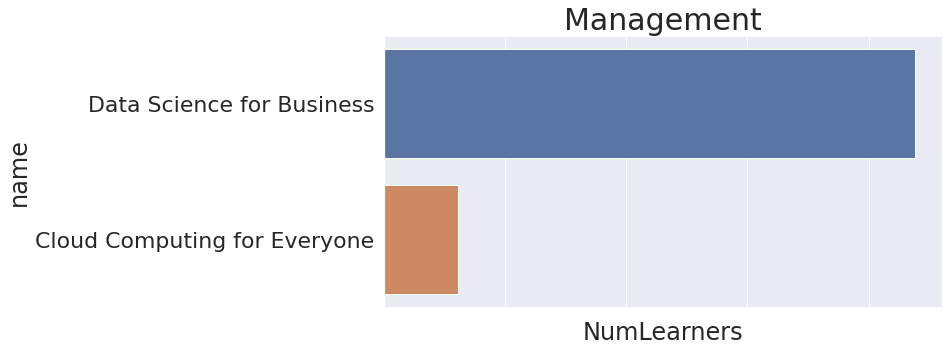

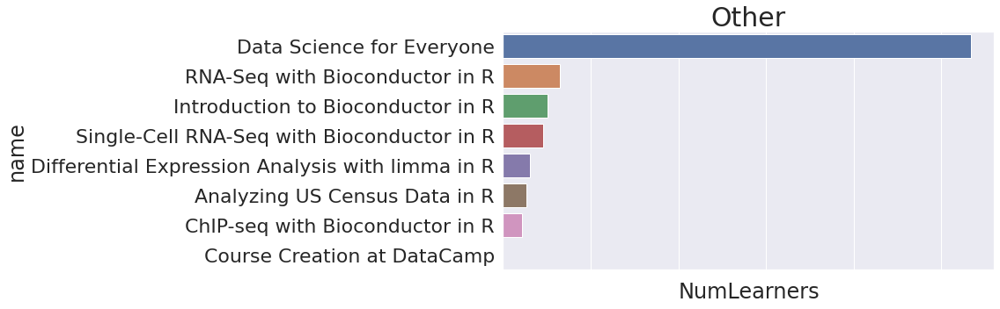

In [ ]:
n = 0
for i in dfs:
    for x in range(len(i)):
        if type(i.loc[x, 'NumLearners']) == str:
            i.loc[x, 'NumLearners'] = i.loc[x, 'NumLearners'].replace(',','')
    
    i['NumLearners'] = pd.to_numeric(i['NumLearners'])
    pop = i.sort_values('NumLearners', ascending = False).reset_index(drop=True)
    
    sns.set(rc={'figure.figsize':(10,5)})
    sns.set(font_scale = 2)
    g = sns.barplot(x="NumLearners", y="name",  data=pop[0:10])
    g.set_xticklabels(g.get_xticklabels(), rotation=90)
    plt.title(topics[n], size = 30)
    plt.show()
    
    n += 1

### combine all topics and find top skills

In [ ]:
courseDF.head(3)

,Unnamed: 0,topic,style,name,description,length,NumLearners,SubElements,link
0,0,Data Engineering,Course,Data Engineering for Everyone,Discover how data engineers lay the groundwork...,2 hours,"26,491","['What is data engineering?', 'Storing data', ...",https://www.datacamp.com/courses/data-engineer...
1,1,Data Engineering,Course,Introduction to Data Engineering,Learn about the world of data engineering with...,4 hours,"44,668","['Introduction to Data Engineering', 'Data eng...",https://www.datacamp.com/courses/introduction-...
2,2,Data Engineering,Course,Database Design,Learn to design databases in SQL.,4 hours,"14,145","['Processing, Storing, and Organizing Data', '...",https://www.datacamp.com/courses/database-design


In [ ]:
courseDF['SubElements'][i].replace("[","").replace("'","").replace(",","")

'Language of data Study types and cautionary tales Sampling strategies and experimental design Case study]'

In [ ]:
text = ''
courses = courseDF[courseDF['style'] == 'Course'].reset_index(drop=True)
for i in range(len(courses['SubElements'])):
        text += ''.join([t for t in courses['SubElements'][i] if not t in punctuations])


In [ ]:
nltk.download('wordnet') 
from nltk.stem.wordnet import WordNetLemmatizer

##Convert to list from string
textlist = text.split()
#Lemmatisation
lem = WordNetLemmatizer()
textlist = [lem.lemmatize(word) for word in textlist if not word in  
            STOPWORDS] 

[nltk_data] Downloading package wordnet to
[nltk_data]     /home/jupyterlab/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/feature_extraction/text.py:300: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


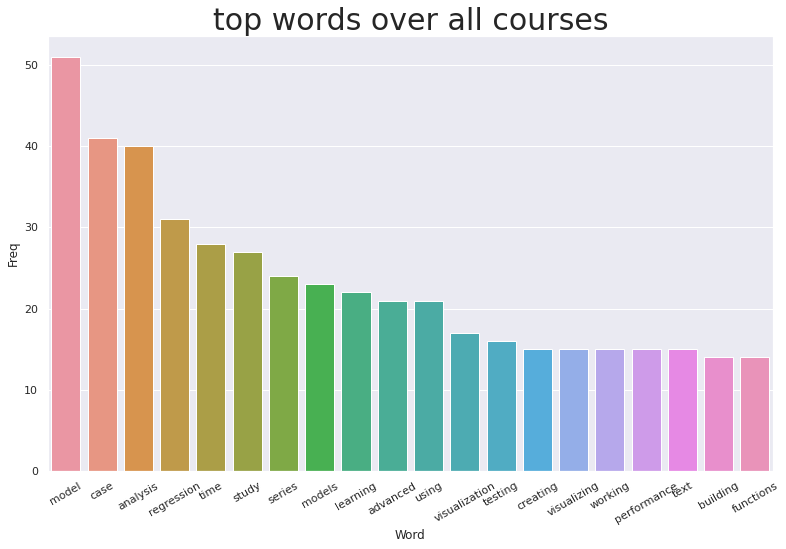

[('model', 51), ('case', 41), ('analysis', 40), ('regression', 31), ('time', 28), ('study', 27), ('series', 24), ('models', 23), ('learning', 22), ('advanced', 21), ('using', 21), ('visualization', 17), ('testing', 16), ('creating', 15), ('visualizing', 15), ('working', 15), ('performance', 15), ('text', 15), ('building', 14), ('functions', 14)]


In [ ]:
top_words = get_top_n_words(textlist, n = 20)
top_df = pd.DataFrame(top_words)
top_df.columns=["Word", "Freq"]
#Barplot of most freq words
sns.set(rc={'figure.figsize':(13,8)})
g = sns.barplot(x="Word", y="Freq", data=top_df)
g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.title('top words over all courses', size = 30)
plt.show()
    
print(top_words)

In [ ]:
# string to list
text = [text]

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/feature_extraction/text.py:300: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


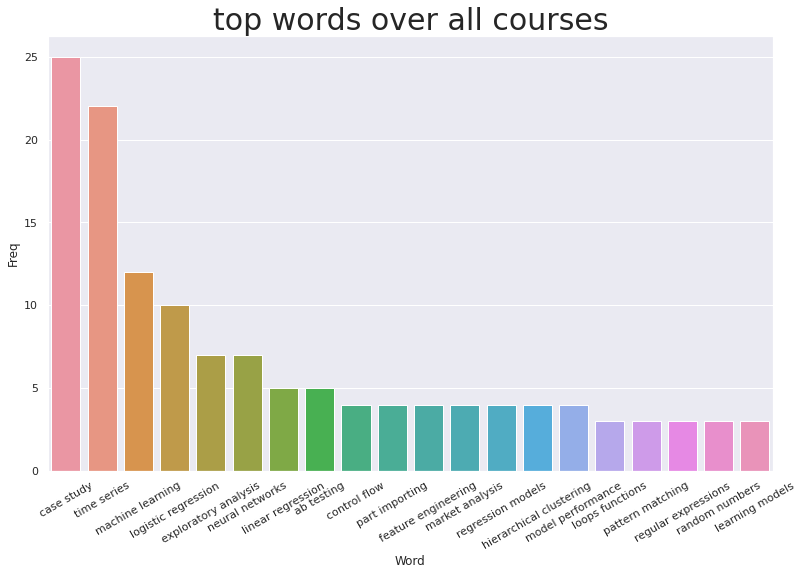

[('case study', 25), ('time series', 22), ('machine learning', 12), ('logistic regression', 10), ('exploratory analysis', 7), ('neural networks', 7), ('linear regression', 5), ('ab testing', 5), ('control flow', 4), ('part importing', 4), ('feature engineering', 4), ('market analysis', 4), ('regression models', 4), ('hierarchical clustering', 4), ('model performance', 4), ('loops functions', 3), ('pattern matching', 3), ('regular expressions', 3), ('random numbers', 3), ('learning models', 3)]


In [ ]:
top_words = get_top_n_bigrams(text, n = 20)
top_df = pd.DataFrame(top_words)
top_df.columns=["Word", "Freq"]
#Barplot of most freq words
sns.set(rc={'figure.figsize':(13,8)})
g = sns.barplot(x="Word", y="Freq", data=top_df)
g.set_xticklabels(g.get_xticklabels(), rotation=30)
plt.title('top words over all courses', size = 30)
plt.show()
    
print(top_words)

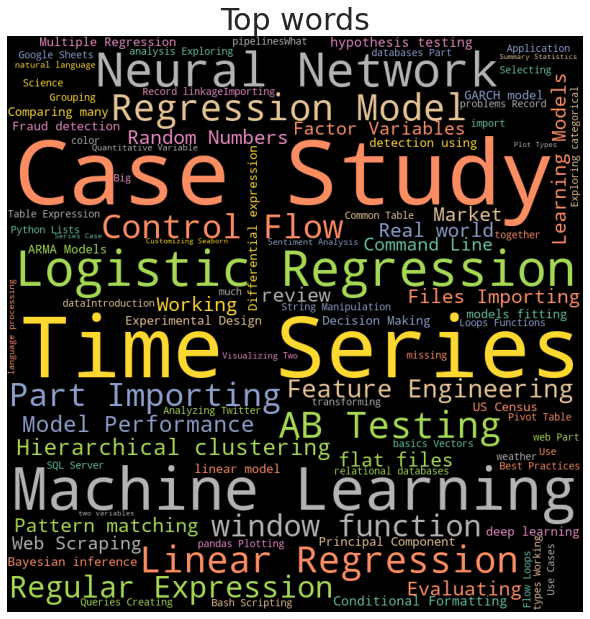

In [ ]:
wordcloud = WordCloud(width = 800, height = 800,background_color='black', stopwords = STOPWORDS,
                      colormap='Set2', collocations=True, collocation_threshold=3,min_font_size = 10,max_words=100).generate(text)
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)
plt.title('Top words', size = 30)
  
plt.show()

In [ ]:
def getkeyList(dict): 
    list = [] 
    for key in dict.keys(): 
        list.append(key) 
          
    return list

def getvalueList(dict): 
    list = [] 
    for val in dict.values(): 
        list.append(val) 
          
    return list

words = wordcloud.words_

w = pd.DataFrame(getkeyList(words)[:15],columns = ['Top Words'])
f = pd.DataFrame(getvalueList(words)[:15],columns=['Frequency'])

In [ ]:
topwords = pd.concat([w,f],axis=1)

In [ ]:
topwords

,Top Words,Frequency
0,Case Study,1.00
1,Time Series,0.88
2,Machine Learning,0.48
3,Logistic Regression,0.40
4,Neural Network,0.36
5,Linear Regression,0.20
6,AB Testing,0.20
7,Regression Model,0.20
8,Control Flow,0.16
9,Part Importing,0.16


Online course descriptiontext processing can tell us about what are the most emphasized skills that should be taught in data science courses.

# 3. Job postings data

Job posting data can help us identify the most required skills for jobs in the field. This 

## (1) Web-scraping

### Indeed job postings

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import time


'''
NOTE THAT THE CONTENTS OF EACH SPREADSHEET ARE INTENDED TO BE CUMULATIVE! (i.e. df3 = df1 + df2 + df3 scraping results)
Code calling and running the functions below has been commented out as per request.
This code may need to be run several times to scrape all data, as Indeed has software in place to detect a spider

Key Source of Code:
https://www.youtube.com/watch?v=PPcgtx0sI2E

(should run without issue, assuming the browser doesn't crash)'''


def extract(page, link):
    headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/87.0.4280.66 Safari/537.36'}
    url = f'{link}{page}'
    r = requests.get(url, headers, timeout = 10)
    soup = BeautifulSoup(r.content, 'html.parser')
    return soup
  #return r.status_code - if this returns 200, then it is working

def transform(soup):
    divs = soup.find_all('div', class_ = 'jobsearch-SerpJobCard')
    #return len(divs) - check if it is working, should return 15
    for item in divs:
        #Job Titles
        title = item.find('a').text.strip()
        #print(title) - check if it is working

        #Company Name
        try:
          company = item.find('span', class_ = 'company').text.strip()
        except:
          company = ''
        #print(company) - check if it is working

        #Salary
        try:
          salary = item.find('span', class_='salaryText').text.strip()
        except:
          salary = ''

        #Requirements
        try:
          requirements = item.find('div', {'class': 'jobCardReqList'}).text.strip()
        except:
          requirements = ''

        #Locations
        try:
          location = item.find('div', {'class': 'location accessible-contrast-color-location'}).text.strip()
        except:
          location = ''
        try: 
          location = item.find('span', class_ = 'location').text.strip()
        except:
          location = ''
        #print(location)
        
        #Summary
        try: 
          summary = item.find('div', {'class': 'summary'} ).text.strip().replace('\n', '')
        except:
          summary = ''

        #Date Listed
        try: 
          date = item.find('span', class_='date').text.strip()
        except:
          date = ''

        #Rating Display
        try:
          rating = item.find('span', class_ = 'ratingsDisplay').text.strip()
        except:
          rating = ''

        job = {
            'title': title,
            'date': date,
            'company': company,
            'rating': rating,
            'salary': salary,
            'location':location,
            'summary': summary,
            'requirements': requirements

        }
        print(job) #- print to check if something is wrong
        joblist.append(job)
    return joblist

joblist = []

In [ ]:
from random import randint
def Run_All(total_it, link):
    joblist = []
    for i in range(0, total_it, 10):
        print(f'Getting page, {i}')
        C = extract(page = i, link = link)
        joblist = transform(C)
        
    time.sleep(2)
    print(2)
    df = pd.DataFrame(joblist)
    print(df.head())
    return df

In [ ]:
pd.options.display.max_colwidth = 500
pd.options.display.max_colwidth

500

In [ ]:
link1 = 'https://www.indeed.co.uk/jobs?q=data+scientist&l=United+Kingdom&start='
#United Kingdom
'''
#df1 = Run_All(750, link1)
'''

Getting page, 0
{'title': 'Data Scientist Degree Apprenticeship, Barnard Castle, 2021', 'date': '', 'company': 'GSK', 'rating': '4.2', 'salary': '', 'location': '', 'summary': '', 'requirements': ''}
{'title': 'Graduate Data Scientist, Electricity System Operator (Multip...', 'date': '', 'company': 'National Grid', 'rating': '3.8', 'salary': '', 'location': '', 'summary': '', 'requirements': ''}
{'title': 'Data Scientist', 'date': '4 days ago', 'company': 'Fidel API', 'rating': '', 'salary': '', 'location': 'London W1F 0TA', 'summary': 'Assess the effectiveness and accuracy of new data sources and data gathering techniques.Present information using data visualization techniques.', 'requirements': ''}
{'title': 'Junior Data Scientist', 'date': '30+ days ago', 'company': 'Novafutur', 'rating': '', 'salary': '', 'location': 'London', 'summary': 'Being a data scientist would require the ability to analyse big data sets coming from heterogeneous producers both in real time and offline, as w

In [ ]:
#Check UK
'''
print(len(df1))
df1 = df1.drop_duplicates(subset = None, keep = 'first', inplace = False, ignore_index = True)
print(len(df1))
df1.to_excel('UK.xlsx') #- export to check contents and confirm it is working right, but otherwise this df is unnecessary
'''

1075
765


In [ ]:
#df1['summary']

0       
1       
2       
3       
4       
      ..
760     
761     
762     
763     
764     
Name: summary, Length: 765, dtype: object

In [ ]:
link2 = 'https://ca.indeed.com/jobs?q=data+scientist&l=Canada&start='
#Canada
#df2 = Run_All(390, link2)

In [ ]:
#Check Canada
'''
print(len(df2))
df2 = df2.drop_duplicates(subset = None, keep = 'first', inplace = False, ignore_index = True)
print(len(df2))
df2.to_excel('Canada.xlsx')
'''

In [ ]:
link3 = 'https://au.indeed.com/jobs?q=data+scientist&l=australia&start='
'''
#Australia
df3 = Run_All(350, link3)
print(len(df3))
df3 = df3.drop_duplicates(subset = None, keep = 'first', inplace = False, ignore_index = True)
print(len(df3))
#df3.to_excel('Australia.xlsx')
'''

In [ ]:
link4 = 'https://hk.indeed.com/jobs?q=data+scientist&l=hong+kong&start='
'''
#Hong Kong
df4 = Run_All(180, link4)
print(len(df4))
df4 = df4.drop_duplicates(subset = None, keep = 'first', inplace = False, ignore_index = True)
print(len(df4))
#df4.to_excel('Hong_Kong.xlsx')
'''

In [ ]:
link5 = 'https://www.indeed.co.in/jobs?q=data+scientist&l=india&start='
'''
#India
df5 = Run_All(800, link5)
print(len(df5))
df5 = df5.drop_duplicates(subset = None, keep = 'first', inplace = False, ignore_index = True)
print(len(df5))
#df5.to_excel('India.xlsx')

Getting page, 0
{'title': 'Data Scientist II', 'date': '', 'company': 'Honeywell', 'rating': '3.7', 'salary': '', 'location': '', 'summary': '', 'requirements': ''}
{'title': 'Data Scientist & AI Expert', 'date': '', 'company': 'Siemens Technology and Services Private Limited', 'rating': '4.0', 'salary': '', 'location': '', 'summary': '', 'requirements': ''}
{'title': 'Data Scientist_TS', 'date': '4 days ago', 'company': 'AppZen', 'rating': '', 'salary': '', 'location': 'Pune, Maharashtra', 'summary': 'With a team of highly skilled and motivated data scientists and machine learning engineers.Ensure data quality throughout all stages of acquisition and…', 'requirements': ''}
{'title': 'Machine Learning Engineer/ Data Scientist', 'date': '1 day ago', 'company': 'Dürr Somac GmbH', 'rating': '', 'salary': '', 'location': 'Noida, Uttar Pradesh', 'summary': 'This includes data processing, data exploration, ML model development & training as well as the deployment.Working in agile cross-funct

In [ ]:
link6 = 'https://www.indeed.com/jobs?q=data+scientist&l=seattle&start='
'''
#Seattle
df6 = Run_All(800, link6)
print(len(df6))
df6 = df6.drop_duplicates(subset = None, keep = 'first', inplace = False, ignore_index = True)
print(len(df6))
#df6.to_excel('Seattle_Solo.xlsx')
'''

In [ ]:
link7 = 'https://www.indeed.com/jobs?q=data+scientist&l=California&start='
'''
#California
df7 = Run_All(800, link7)
print(len(df7))
df7 = df7.drop_duplicates(subset = None, keep = 'first', inplace = False, ignore_index = True)
print(len(df7))
#df7.to_excel('California_Solo.xlsx')
'''

In [ ]:
link8 = 'https://www.indeed.com/jobs?q=data+scientist&l=united+states&start='
'''
#All of the United States
df8 = Run_All(800, link8)
print(len(df8))
df8 = df8.drop_duplicates(subset = None, keep = 'first', inplace = False, ignore_index = True)
print(len(df8))
#df8.to_excel('United_States_Solo.xlsx')
'''

In [ ]:
#len(df8) #check length of all scraped data

In [ ]:
'''
#Add all dfs together, since they are cumulative, this is akin to setting the final df to df8
final_df = pd.DataFrame()
final_df = df8
'''

In [ ]:
''' #Export df for future use
final_df.to_csv('Indeed_Scraping.csv')
'''

### Monster job postings

In [ ]:
!pip install beautifulsoup4
!pip install NLTK
!pip install wordcloud

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import urllib
from bs4 import BeautifulSoup as bfs
import datetime
import ast
import csv
import requests
from IPython.display import HTML

import re
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
nltk.download('wordnet') 
from nltk.stem.wordnet import WordNetLemmatizer

from sklearn.feature_extraction.text import CountVectorizer

%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Whitney\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Whitney\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Whitney\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
# get content from URL
url = "https://www.monster.com/jobs/search/?q=Data-Scientist&stpage=1&page=10"
page = requests.get(url)
soup = bfs(page.content, "lxml")
#print (soup)

In [ ]:
# find tag for each job listing information
'''
links = []
for htag in soup.find_all('h2', {'class': 'title'}):
    for aTag in htag.find_all('a'):
        links.append(aTag.get('href'))
print(len(links))
'''

250


In [ ]:
# iterate each job listing page and get data
'''
jobs = []
for link in links:
    page = requests.get(link)
    soup = bfs(page.content, "lxml")
    #print(soup)
    # get job title
    try:
        title = soup.find("h1",{'class':'job_title'}).get('title')
    except AttributeError:
        title = "N/A"
        
    # get job location
    try:
        location = soup.find("div",{'class':'location'}).text
    except AttributeError:
        location = "N/A"
        
    # get job description
    desc = ""
    try:
        desctag = soup.find("div",{'name':'sanitizedHtml'})
        for elem in desctag.find_all(['p','li']):
            desc = desc + elem.text + "\n"
        desc.rstrip("\n")
    except AttributeError:
        desc = 'N/A'
    jobs.append((title, location ,desc))

jobDf = pd.DataFrame(jobs, colums = ["title", "location" , "description"])
jobDf.head()
'''

Monster job posting word frequency analyses:

In [ ]:
desc = pd.read_csv("job_monster.csv")
desc.isnull().sum()
desc.dropna(subset=['description'])
desc = desc[desc["description"].str.len()>50]

In [ ]:
new_stopwords =['data','experience','year','technology','work','science','ability','gender','degree','computer','skill',
                'qualified','applicant','equal','orientation','sexual'
               ]
stopWords = set(stopwords.words('english')).union(new_stopwords)

In [ ]:
data = desc["description"].str.lower()


texts = []
for word in data.values:
     #Remove punctuations
    text = re.sub('[^a-zA-Z]', ' ', word)
    
    #Convert to lowercase
    text = text.lower()
    
    #remove tags
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    
    # remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    ##Convert to list from string
    text = text.split()
    
    ##Stemming
    ps=PorterStemmer()
    
    #Lemmatisation
    lem = WordNetLemmatizer()
    text = [lem.lemmatize(word) for word in text if not word in  
            stopWords] 
    text = " ".join(text)
    texts.append(text)
    
            

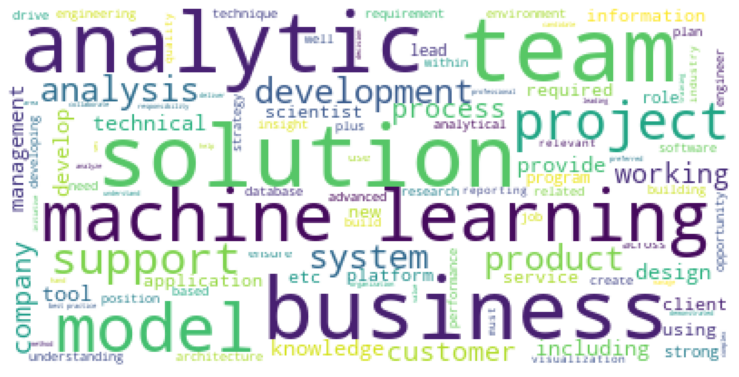

In [ ]:
#Word cloud
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

wordcloud = WordCloud(
                          background_color='white',
                          stopwords=stopWords,
                          max_words=100,
                          max_font_size=50, 
                          random_state=42
                         ).generate(str(texts))
print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()
fig.savefig("word1.png", dpi=900)

In [ ]:
cv=CountVectorizer(max_df=0.8,stop_words=stopWords, max_features=10000, ngram_range=(1,3))

X=cv.fit_transform(texts)

#Most frequently occuring
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in      
                   vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                       reverse=True)
    return words_freq[:n]


[Text(0, 0, 'business'),
 Text(0, 0, 'team'),
 Text(0, 0, 'product'),
 Text(0, 0, 'learning'),
 Text(0, 0, 'analysis'),
 Text(0, 0, 'model'),
 Text(0, 0, 'skill'),
 Text(0, 0, 'year'),
 Text(0, 0, 'solution'),
 Text(0, 0, 'analytics'),
 Text(0, 0, 'development'),
 Text(0, 0, 'system'),
 Text(0, 0, 'machine'),
 Text(0, 0, 'project'),
 Text(0, 0, 'technical'),
 Text(0, 0, 'support'),
 Text(0, 0, 'design'),
 Text(0, 0, 'working'),
 Text(0, 0, 'management'),
 Text(0, 0, 'information')]

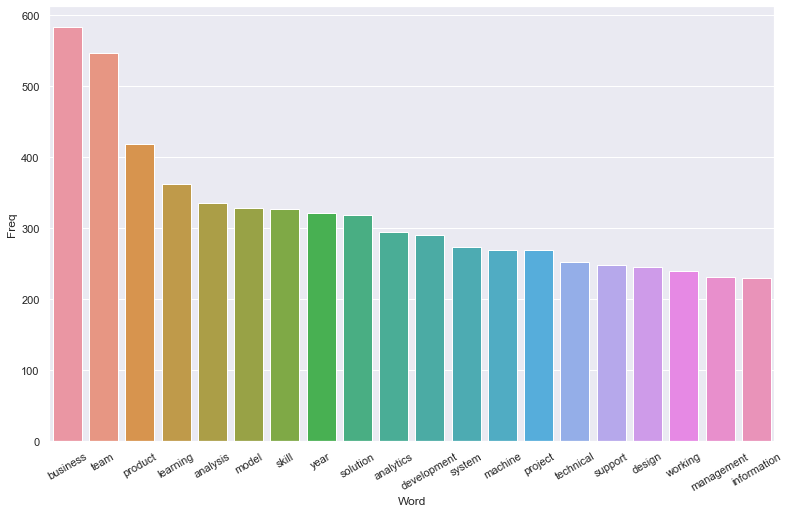

In [ ]:
#Convert most freq words to dataframe for plotting bar plot
top_words = get_top_n_words(texts, n=20)
top_df = pd.DataFrame(top_words)
top_df.columns=["Word", "Freq"]
#Barplot of most freq words
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
g = sns.barplot(x="Word", y="Freq", data=top_df)
g.set_xticklabels(g.get_xticklabels(), rotation=30)

In [ ]:
#Most frequently occuring Bi-grams
def get_top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2),  
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

                    Bi-gram  Freq
0          machine learning   260
1         equal opportunity    73
2       communication skill    61
3             best practice    60
4      opportunity employer    55
5           national origin    54
6             related field    52
7            veteran status    51
8             deep learning    49
9      programming language    48
10               race color    48
11             product team    47
12          sexual identity    46
13         cross functional    44
14           color religion    43
15          problem solving    39
16          language python    39
17  artificial intelligence    37
18                long term    35
19         business problem    34


[Text(0, 0, 'machine learning'),
 Text(0, 0, 'equal opportunity'),
 Text(0, 0, 'communication skill'),
 Text(0, 0, 'best practice'),
 Text(0, 0, 'opportunity employer'),
 Text(0, 0, 'national origin'),
 Text(0, 0, 'related field'),
 Text(0, 0, 'veteran status'),
 Text(0, 0, 'deep learning'),
 Text(0, 0, 'programming language'),
 Text(0, 0, 'race color'),
 Text(0, 0, 'product team'),
 Text(0, 0, 'sexual identity'),
 Text(0, 0, 'cross functional'),
 Text(0, 0, 'color religion'),
 Text(0, 0, 'problem solving'),
 Text(0, 0, 'language python'),
 Text(0, 0, 'artificial intelligence'),
 Text(0, 0, 'long term'),
 Text(0, 0, 'business problem')]

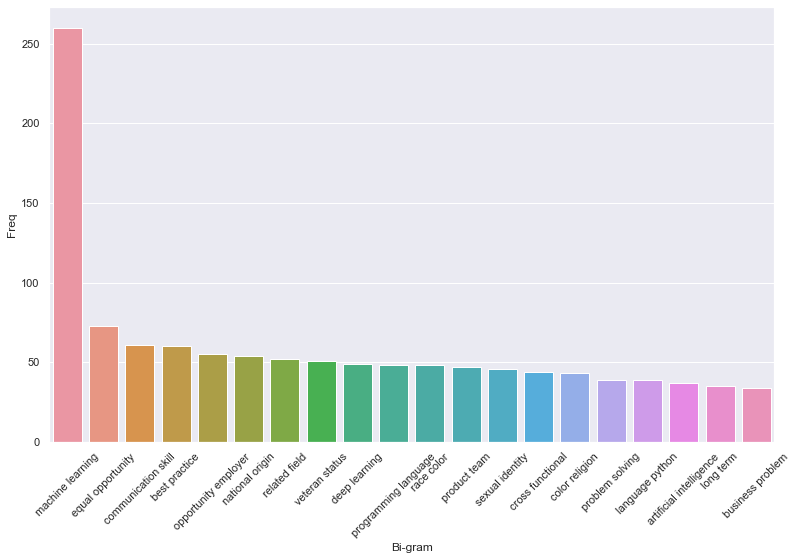

In [ ]:
top2_words = get_top_n2_words(texts, n=20)
top2_df = pd.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Freq"]
print(top2_df)
#Barplot of most freq Bi-grams
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
h=sns.barplot(x="Bi-gram", y="Freq", data=top2_df)
h.set_xticklabels(h.get_xticklabels(), rotation=45)

### LinkedIn job posting scraping

In [ ]:
# importing packages
import pandas as pd
import re

from bs4 import BeautifulSoup
from datetime import date, timedelta, datetime
from IPython.core.display import clear_output
from random import randint
from requests import get
from selenium import webdriver
from selenium.webdriver.common.action_chains import ActionChains
from time import sleep
from time import time
start_time = time()

from warnings import warn

In [ ]:
# replace variables here.
url = "https://www.linkedin.com/jobs/search?keywords=Machine%2BLearning&location=Canada&geoId=101174742&trk=public_jobs_jobs-search-bar_search-submit&f_JT=I&redirect=false&position=1&pageNum=0"
no_of_pages =20

In [ ]:
# this will open up new window with the url provided above 
driver = webdriver.Chrome()
driver.get(url)
sleep(3)
action = ActionChains(driver)

In [ ]:
#stringscroll = 'window.scrollTo(0,'+str(4230*pgs)+')'
#print (stringscroll)

In [ ]:
#driver.find_element_by_xpath('//*[@id="main-content"]/div/section/button').click()

In [ ]:
pgs = 1 

while pgs < no_of_pages:
    stringscroll = 'window.scrollTo(0,'+str(4230*pgs)+')'
    driver.execute_script(stringscroll)
    pgs +=1
    sleep(3)
    try:
        driver.find_element_by_xpath('//*[@id="main-content"]/div/section/button').click()
    except:
        pass
    print(pgs)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


In [ ]:
# parsing the visible webpage
pageSource = driver.page_source
lxml_soup = BeautifulSoup(pageSource, 'lxml')

# searching for all job containers
job_container = lxml_soup.find('ul', class_ = 'jobs-search__results-list')

print('You are scraping information about {} jobs.'.format(len(job_container)))

You are scraping information about 444 jobs.


In [ ]:
# setting up list for job information
job_id = []
post_title = []
company_name = []
post_date = []
job_location = []
job_desc = []
level = []
emp_type = []
functions = []
industries = []

# for loop for job title, company, id, location and date posted
for job in job_container:
    
    # job title
    job_titles = job.find("span", class_="screen-reader-text").text
    post_title.append(job_titles)
    
    # linkedin job id
    job_ids = job.find('a', href=True)['href']
    job_ids = re.findall(r'(?!-)([0-9]*)(?=\?)',job_ids)[0]
    job_id.append(job_ids)
    
    # company name
    company_names = job.select_one('img')['alt']
    company_name.append(company_names)
    
    # job location
    job_locations = job.find("span", class_="job-result-card__location").text
    job_location.append(job_locations)
    
    # posting date
    post_dates = job.select_one('time')['datetime']
    post_date.append(post_dates)

# for loop for job description and criterias
for x in range(1,len(job_id)+1):
    
    # clicking on different job containers to view information about the job
    job_xpath = '/html/body/main/div/section/ul/li[{}]/img'.format(x)
    driver.find_element_by_xpath(job_xpath).click()
    sleep(5)  #Maybe too long
    
    # job description
    #jobdesc_xpath = '/html/body/main/section/div[2]/section[2]/div'
    jobdesc_xpath='/html/body/main/section/div[2]/section[2]/div/section/div'
    job_descs = driver.find_element_by_xpath(jobdesc_xpath).text
    job_desc.append(job_descs)
    
    
    # job criteria container below the description
    job_criteria_container = lxml_soup.find('ul', class_ = 'job-criteria__list')
    all_job_criterias = job_criteria_container.find_all("span", class_='job-criteria__text job-criteria__text--criteria')
    
    # Seniority level
    seniority_xpath = '/html/body/main/section/div[2]/section[2]/ul/li[1]'
    seniority = driver.find_element_by_xpath(seniority_xpath).text.splitlines(0)[1]
    level.append(seniority)
    
    # Employment type
    type_xpath = '/html/body/main/section/div[2]/section[2]/ul/li[2]'
    employment_type = driver.find_element_by_xpath(type_xpath).text.splitlines(0)[1]
    emp_type.append(employment_type)
    
    # Job function
    function_xpath = '/html/body/main/section/div[2]/section[2]/ul/li[3]'
    job_function = driver.find_element_by_xpath(function_xpath).text.splitlines(0)[1]
    functions.append(job_function)
    
    # Industries
    industry_xpath = '/html/body/main/section/div[2]/section[2]/ul/li[4]'
    industry_type = driver.find_element_by_xpath(industry_xpath).text.splitlines(0)[1]
    industries.append(industry_type)
    
    x = x+1


In [ ]:
# to check if we have all information
print(len(job_id))
print(len(post_date))
print(len(company_name))
print(len(post_title))
print(len(job_location))
print(len(job_desc))
print(len(level))
print(len(emp_type))
print(len(functions))
print(len(industries))

444
444
444
444
444
444
444
444
444
444


In [ ]:
# creating a dataframe
job_data = pd.DataFrame({'Job ID': job_id,
'Date': post_date,
'Company Name': company_name,
'Post': post_title,
'Location': job_location,
'Description': job_desc,
'Level': level,
'Type': emp_type,
'Function': functions,
'Industry': industries
})

# cleaning description column
job_data['Description'] = job_data['Description'].str.replace('\n',' ')

print(job_data.info())
job_data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 444 entries, 0 to 443
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Job ID        444 non-null    object
 1   Date          444 non-null    object
 2   Company Name  444 non-null    object
 3   Post          444 non-null    object
 4   Location      444 non-null    object
 5   Description   444 non-null    object
 6   Level         444 non-null    object
 7   Type          444 non-null    object
 8   Function      444 non-null    object
 9   Industry      444 non-null    object
dtypes: object(10)
memory usage: 17.4+ KB
None


,Job ID,Date,Company Name,Post,Location,Description,Level,Type,Function,Industry
0,2215727776,2020-10-26,Cognizant,Business Analyst - AML,"Toronto, Ontario, Canada",AML Regulatory Changes – Implementation of sev...,Associate,Full-time,Business DevelopmentSales,Information Technology and ServicesManagement ...
1,2215723707,2020-10-26,Achievers,Data Analyst,"Toronto, Ontario, Canada",Achievers delivers an Employee Success Platfor...,Entry level,Full-time,Information Technology,Information Technology and ServicesComputer So...
2,2243499019,2020-10-26,Botsford Associates,Senior Business Analyst,"Toronto, Ontario, Canada",Our banking client is currently looking for Se...,Mid-Senior level,Contract,Consulting,Capital Markets
3,2215718774,2020-10-26,CROSSMARK,SR BUSINESS ANALYST,"Mississauga, Ontario, Canada",This position is newly created to directly sup...,Associate,Full-time,Business DevelopmentSales,Food & BeveragesConsumer GoodsRetail
4,2215721206,2020-10-26,NTT DATA Services,Senior Business Analyst - Health,"Halifax, Nova Scotia, Canada","NTT DATA Services strives to hire exceptional,...",Mid-Senior level,Full-time,Consulting,Information Technology and Services


In [ ]:
job_data.to_csv('LinkedIn Job Data.csv', index=0)

### Combining all job posting data scraped from different websites

In [ ]:
import pandas as pd

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Indeed_Scraping (1).csv to Indeed_Scraping (1).csv
Saving job_monster (1).csv to job_monster (1).csv
Saving LinkedIn Job Data_20201124.csv to LinkedIn Job Data_20201124.csv


In [ ]:
df1= pd.read_csv('Indeed_Scraping.csv')
pd.options.display.max_colwidth = 200

# drop job ID
df1.drop('Unnamed: 0', axis=1, inplace=True)
df1.drop('company', axis=1, inplace=True)
df1.drop('rating', axis=1, inplace=True)
df1.drop('salary', axis=1, inplace=True)
df1.drop('date', axis=1, inplace=True)
df1.requirements.to_string()
df1['requirements'].loc[df1['requirements'].isnull()] = ""
df1.drop('requirements', axis=1, inplace=True)
df1.rename(columns={"title": "Title", "location": "Location", "summary": "Description"}, inplace=True)
df1.head()

,Title,Location,Description
0,Data Scientist,Chandlers Ford,"As an experienced Data Scientist, you will use advanced data analysis techniques to recommend improvements across all company activities."
1,Data Scientist Intern,London,You’ll help support the Buzz Radar product roadmap by helping our data analysts research new data sources and latest analysis techniques.
2,Data Scientist,Shaftesbury,"An important part of data science is extracting, transforming and loading data which requires excellent programming and scripting skills."
3,Data Scientist,London,"Strong working knowledge of machine learning models, data mining.This role is being created to support Development & Innovation develop and explore new…"
4,Data Scientist / Software Developer,Abingdon,"Using data science, analytics and a variety of analytical, statistical or machine learning techniques to interpret client data, helping them to make better…"


In [ ]:
df2= pd.read_csv('job_monster.csv')
pd.options.display.max_colwidth = 200
df2.rename(columns={"title": "Title", "location": "Location", "description": "Description"}, inplace=True)
df2.head()

,Title,Location,Description
0,Data Scientist,"Boston, Massachusetts 02210","Fidelity TalentSource is your destination for discovering your next temporary role at Fidelity Investments. We are currently sourcing for a Data Scientist to work at Fidelity in Boston, MA.\nAt Fi..."
1,Data Scientist 3,"Canoga Park, California",Aerojet Rocketdyne is an innovative company delivering solutions that create value for its customers in the aerospace and defense markets. The company is a world-recognized aerospace and defense l...
2,Data Scientist,"Hampton, Virginia","Infoscitex, a DCS company, is an employee owned organization with a reputation for agile and efficient development of technology solutions for U.S. Defense, Aerospace, Human Factors, and Security ..."
3,Senior Data Scientist-100% REMOTE (Local candidates preferred),"Alexandria, Virginia 22302",NaN
4,DATA SCIENTIST,"PITTSBURGH, Pennsylvania 15220","DATA SCIENTIST\nHighmark Health seeks Data Scientist in Pittsburgh, PA to develop, coordinate, & mng analytics, models, health outcome studies & rltd forecasting, as well as actual results analysi..."


In [ ]:
df3= pd.read_csv('LinkedIn Job Data_20201124.csv')
pd.options.display.max_colwidth = 200

# drop things
df3.drop('Company Name', axis=1, inplace=True)
df3.drop('Job ID', axis=1, inplace=True)
df3.drop('Industry', axis=1, inplace=True)
df3.drop('Function', axis=1, inplace=True)
df3.drop('Type', axis=1, inplace=True)
df3.drop('Level', axis=1, inplace=True)
df3.drop('Date', axis=1, inplace=True)
df3.rename(columns={"Post": "Title", "Location	": "Location", "Description": "Description"}, inplace=True)
df3.head()

,Title,Location,Description
0,Marketing Data & Budget Analyst,"Mississauga, Ontario, Canada","At Kia, we live and breathe our slogan - the Power to Surprise. As a brand with just over 20 years of presence in Canada, we are a young company with a fast-paced , collaborative and innovative wo..."
1,"QA Automation Engineer, mat leave contract (Askuity)","Toronto, Ontario, Canada",Askuity is a Toronto-based retail analytics software company operating as an innovative new division within The Home Depot. Askuity’s mission is to enable suppliers and merchants at The Home Depot...
2,Senior IT business analyst - data governance,"Montréal-Est, Quebec, Canada","FRENCH VERSION BELOW We are recruiting, for a major insurance firm, a data governance specialist for a 6-month renewable term . This team will be growing over the next few months. The mandate is..."
3,Retail Data Analyst,"Markham, Ontario, Canada","Job Summary The purpose of the Data Analyst position will be involved in creating analysis for Retail Business activities, and system efficiencies and accuracy. ON-Markham"
4,Business Analyst (Healthcare experience),"Toronto, Ontario, Canada",Job Description Role: This role will be supporting the current business analyst team with multiple projects that are already underway on a project involving the Salesforce platform. Resource will...


In [ ]:
full_table = pd.DataFrame()
full_table = full_table.append(df1)
full_table = full_table.append(df2)
full_table = full_table.append(df3)

In [ ]:
print(full_table.shape)
print(df1.shape[0])
print(df2.shape[0])
print(df3.shape[0])

(5137, 3)
3787
366
984


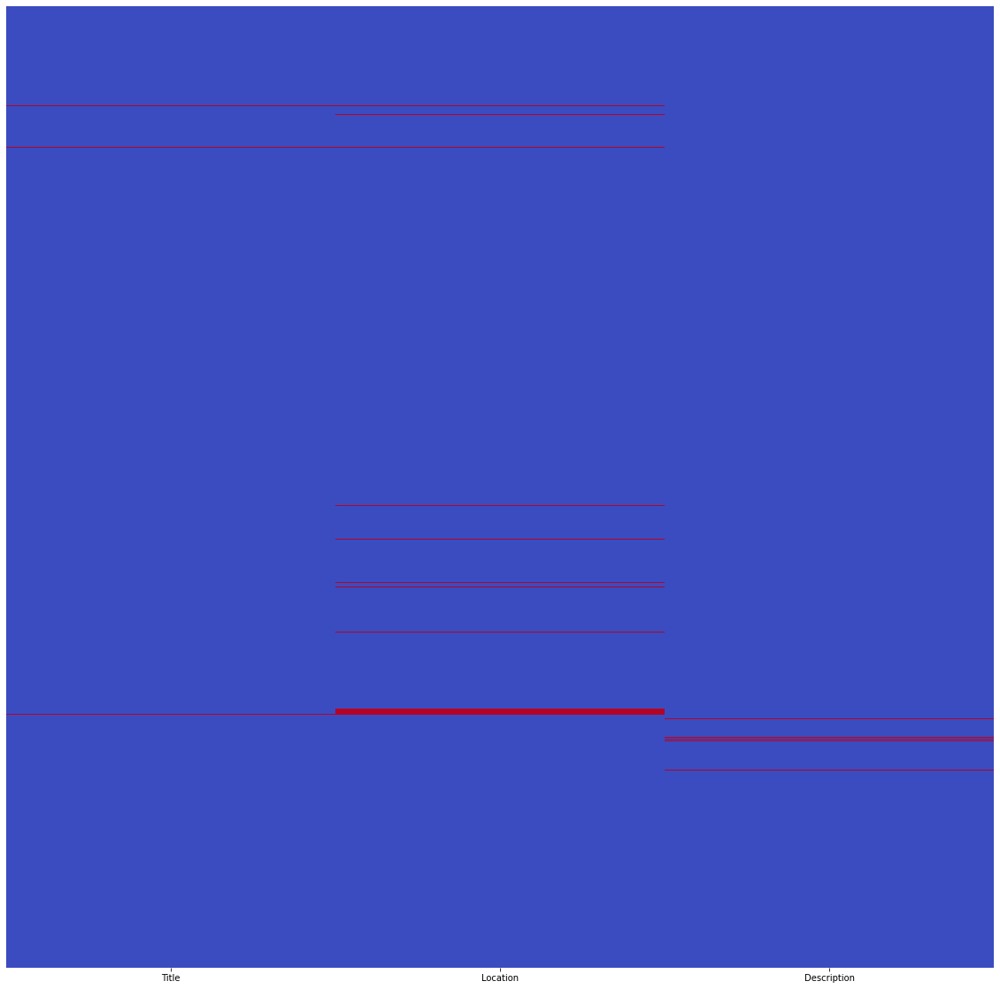

In [ ]:
# Check out new heatmap
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(full_table.isnull(), cmap='coolwarm', yticklabels=False, cbar=False, ax=ax)

In [ ]:
full_table.dropna(inplace=True)

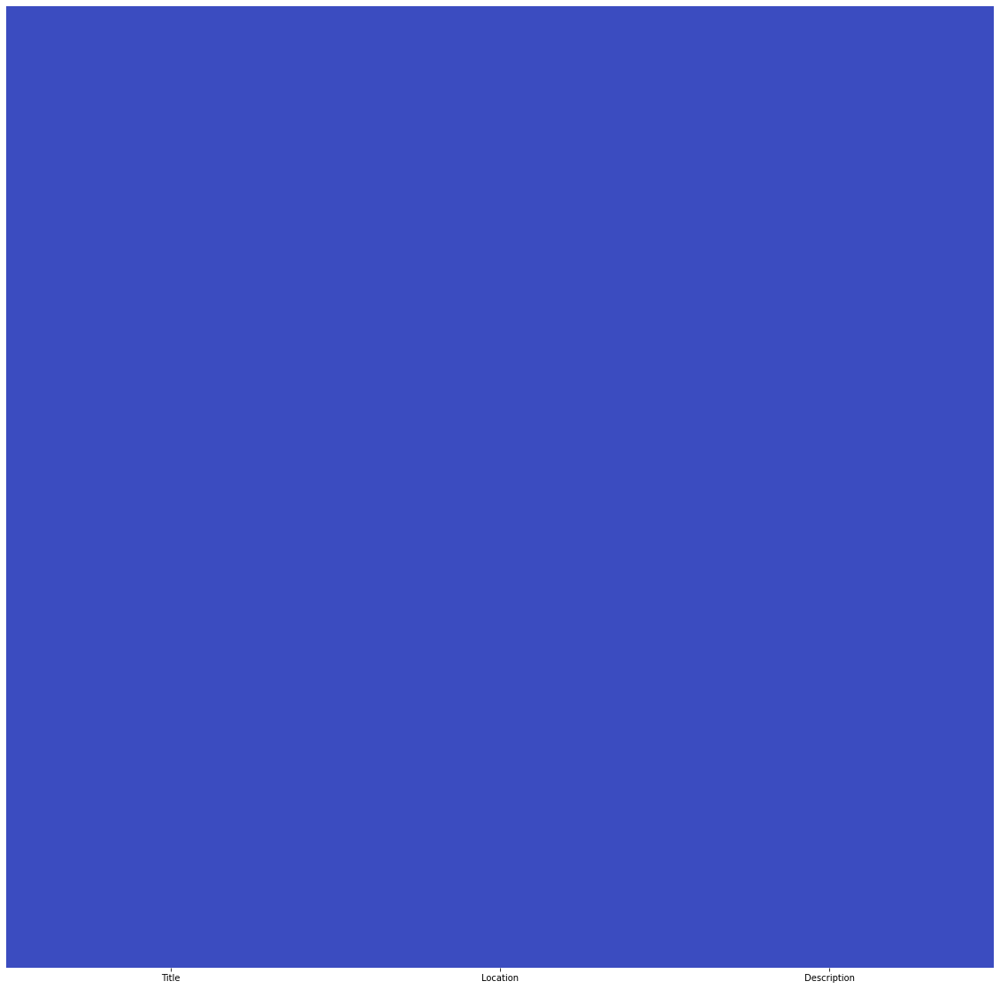

In [ ]:
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(full_table.isnull(), cmap='coolwarm', yticklabels=False, cbar=False, ax=ax)

In [ ]:
full_table.to_csv('Full_Job_Data_Set_Updated_26Nov.csv')

## (2) Keyword analysis on job posting data

https://www.andyfitzgeraldconsulting.com/writing/keyword-extraction-nlp/

Goal!

create single and multi-term keyword lists (called n-grams) from a large (3,000+ records), unstructured data set. These lists will help us frame a basic high level understanding of the dataset’s contents.

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

In [ ]:
df = pd.read_csv('/content/Full_Job_Data_Set_Updated_26Nov.csv')
#df= pd.read_csv('/content/Full_Job_Data_Set.csv')
#df= pd.read_csv('/content/drive/My Drive/Full_Job_Data_Set.csv')

In [ ]:
#pd.options.display.max_colwidth = 1000
df.describe(include='all')

,Unnamed: 0,Title,Location,Description
count,5001.000000,5001,5001,5001
unique,NaN,3426,864,4643
top,NaN,Data Scientist,"Toronto, Ontario, Canada",Overview Intuit's Customer Success team withi...
freq,NaN,423,305,10
mean,1499.413917,NaN,NaN,NaN
std,1140.808176,NaN,NaN,NaN
min,0.000000,NaN,NaN,NaN
25%,469.000000,NaN,NaN,NaN
50%,1229.000000,NaN,NaN,NaN
75%,2480.000000,NaN,NaN,NaN


In [ ]:
import re
import nltk

nltk.download('stopwords')
nltk.download('wordnet')

from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
# Create a list of stop words from nltk
stop_words = set(stopwords.words("english"))
french = set(stopwords.words('french'))
stop_words = stop_words.union(french)
print(sorted(stop_words))

['a', 'about', 'above', 'after', 'again', 'against', 'ai', 'aie', 'aient', 'aies', 'ain', 'ait', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'au', 'aura', 'aurai', 'auraient', 'aurais', 'aurait', 'auras', 'aurez', 'auriez', 'aurions', 'aurons', 'auront', 'aux', 'avaient', 'avais', 'avait', 'avec', 'avez', 'aviez', 'avions', 'avons', 'ayant', 'ayante', 'ayantes', 'ayants', 'ayez', 'ayons', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'c', 'can', 'ce', 'ces', 'couldn', "couldn't", 'd', 'dans', 'de', 'des', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'du', 'during', 'each', 'elle', 'en', 'es', 'est', 'et', 'eu', 'eue', 'eues', 'eurent', 'eus', 'eusse', 'eussent', 'eusses', 'eussiez', 'eussions', 'eut', 'eux', 'eûmes', 'eût', 'eûtes', 'few', 'for', 'from', 'furent', 'further', 'fus', 'fusse', 'fussent', 'fusses', 'fussiez', 'fussions', 'fut', 'fûmes', 'fût', 'fûtes', 'had', 'ha

In [ ]:
#Load a set of custom stop words from a text file (one stopword per line)
#csw = set(line.strip() for line in open('custom-stopwords.txt'))
#csw = [sw.lower() for sw in csw]
#print(sorted(csw)
csw=['equal', 'opportunity', 'employer','use','advanced','experienced','used','technique','recommend', 'improvement', 
     'across', 'company', 'activity', 'scientist use', 'across company', 'help', 'support', 'helping', 'new','source',
     'latest', 'important', 'part','science', 'transforming', 'requires', 'excellent','machine']

In [ ]:
# Combine custom stop words with stop_words list
stop_words = stop_words.union(csw)
print(sorted(stop_words))

['a', 'about', 'above', 'across', 'across company', 'activity', 'advanced', 'after', 'again', 'against', 'ai', 'aie', 'aient', 'aies', 'ain', 'ait', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'au', 'aura', 'aurai', 'auraient', 'aurais', 'aurait', 'auras', 'aurez', 'auriez', 'aurions', 'aurons', 'auront', 'aux', 'avaient', 'avais', 'avait', 'avec', 'avez', 'aviez', 'avions', 'avons', 'ayant', 'ayante', 'ayantes', 'ayants', 'ayez', 'ayons', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'c', 'can', 'ce', 'ces', 'company', 'couldn', "couldn't", 'd', 'dans', 'de', 'des', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'du', 'during', 'each', 'elle', 'employer', 'en', 'equal', 'es', 'est', 'et', 'eu', 'eue', 'eues', 'eurent', 'eus', 'eusse', 'eussent', 'eusses', 'eussiez', 'eussions', 'eut', 'eux', 'excellent', 'experienced', 'eûmes', 'eût', 'eûtes', 'few', 'for', 'from', 'furent', '

- Stemming is a process where words are reduced to a root by removing inflection through dropping unnecessary characters, usually a suffix. There are several stemming models, including Porter and Snowball.

- Lemmatization is the process of converting a word to its base form. The difference between stemming and lemmatization is, lemmatization considers the context and converts the word to its meaningful base form, whereas stemming just removes the last few characters, often leading to incorrect meanings and spelling errors.

Though this process, known as “text mining,” is necessarily reductive, it offers several points of entry into a dataset that otherwise might look hopelessly impenetrable:

Keywords themselves can be useful, particularly in formulating a response to “What are people most frequently talking/asking about?”

Keywords can help you focus in on smaller sets of individual records in order to learn more about them and begin to answer particular questions about user needs and goals

Keywords in combination with analysis of smaller sets of individual records can help you identify gaps in your understanding of users that can help focus subsequent research efforts


PRE-PROCESS THE DATASET TO GET A CLEANED, NORMALIZED TEXT CORPUS
Pre-processing includes removing punctuation, tags, and special characters from the text, and then normalizing what’s left into recognizable words. The normalization process includes “stemming,” which removes suffixes and prefixes from word roots, and “lemmatization” which maps the remaining root forms (which may not always be proper words) back to an actual word that occurs in natural language.

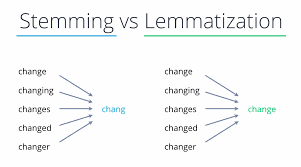

In [ ]:
# Pre-process dataset to get a cleaned and normalised text corpus
dataset=df
datacol='Description'
corpus = []
dataset['word_count'] = dataset[datacol].apply(lambda x: len(str(x).split(" ")))
ds_count = len(dataset.word_count)

for i in range(0, ds_count):
    # Remove punctuation
    # marks, such as period, comma, and parentheses, used in writing to separate sentences and their elements and to clarify meaning.
    text = re.sub('[^a-zA-Z]', ' ', str(dataset[datacol][i]))
    
    # Convert to lowercase
    # needed for stop words to figure things out
    text = text.lower()
    
    # Remove tags
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    
    # Remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    # Convert to list from string
    # i guess this splits each word into a list entry
    text = text.split()
    
    # Stemming
    # Stemming is a process where words are reduced to a root by removing inflection through dropping unnecessary characters, 
    # usually a suffix. There are several stemming models, including Porter and Snowball
    ps=PorterStemmer()
    
    # Lemmatisation

    lem = WordNetLemmatizer()
    text = [lem.lemmatize(word) for word in text if not word in  
            stop_words] 
    text = " ".join(text)
    corpus.append(text)

These processes all together identify a canonical representative for a set of related word forms, which allows us to assess word frequency independent of morphological (word form) variations.

In [ ]:
#View sample pre-processed corpus item
corpus[1]

'buzz radar product roadmap data analyst research data source analysis technique'

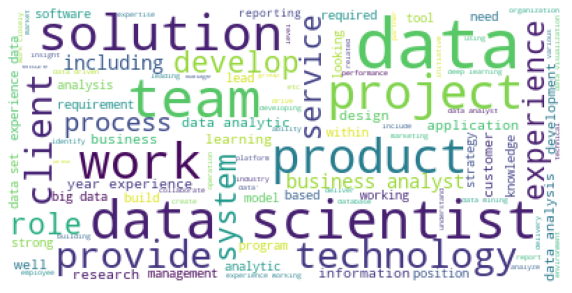

In [ ]:
# Generate word cloud
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
%matplotlib inline
wordcloud = WordCloud(
                          background_color='white',
                          stopwords=stop_words,
                          max_words=100,
                          max_font_size=50, 
                          random_state=42
                         ).generate(str(corpus))  # change what the word cloud is made of
print(wordcloud)
fig = plt.figure(1, figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()
#fig.savefig(file_prefix + "wordcloud.png", dpi=900)

Tokenization is essentially splitting a phrase, sentence, paragraph, or an entire text document into smaller units, such as individual words or terms. Each of these smaller units are called tokens.

The CountVectorizer provides a simple way to both **tokenize a collection of text documents and build a vocabulary of known words, but also to encode new documents using that vocabulary.**

You can use it as follows:

- Create an instance of the CountVectorizer class.
- Call the fit() function in order to learn a vocabulary from one or more documents.
- Call the transform() function on one or more documents as needed to encode each as a vector.

***An encoded vector is returned with a length of the entire vocabulary and an integer count for the number of times each word appeared in the document. ***

Because these vectors will contain a lot of zeros, we call them sparse. Python provides an efficient way of handling sparse vectors in the scipy.sparse package.

The vectors returned from a call to transform() will be sparse vectors, and you can transform them back to numpy arrays to look and better understand what is going on by calling the toarray() function.

In [ ]:
# Tokenize the text and build a vocabulary of known words
from sklearn.feature_extraction.text import CountVectorizer
import re
# initialize the count vectorizer 
cv=CountVectorizer(max_df=0.8,stop_words=stop_words, max_features=10000, ngram_range=(1,3))
# fit it to corpus 
X=cv.fit_transform(corpus)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['scientist'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


In [ ]:
# Sample the returned vector encoding the length of the entire vocabulary
list(cv.vocabulary_.keys())[:10]
# summarize
print(cv.vocabulary_)

{'data': 2320, 'scientist': 7967, 'analysis': 386, 'data scientist': 2528, 'scientist data': 7972, 'data analysis': 2326, 'data scientist data': 2533, 'product': 6965, 'roadmap': 7835, 'analyst': 424, 'research': 7681, 'product roadmap': 6991, 'roadmap data': 7836, 'data analyst': 2332, 'research data': 7683, 'research data analysis': 7684, 'extracting': 3814, 'loading': 5442, 'programming': 7064, 'scripting': 8014, 'skill': 8291, 'data programming': 2509, 'strong': 8655, 'working': 9853, 'knowledge': 5099, 'learning': 5251, 'model': 5905, 'mining': 5857, 'role': 7848, 'created': 2163, 'development': 2867, 'innovation': 4783, 'develop': 2831, 'explore': 3778, 'strong working': 8688, 'working knowledge': 9879, 'knowledge learning': 5108, 'learning model': 5281, 'model data': 5910, 'data mining': 2466, 'learning model data': 5282, 'using': 9440, 'analytics': 488, 'variety': 9525, 'analytical': 474, 'statistical': 8548, 'interpret': 4925, 'client': 1577, 'make': 5558, 'better': 985, 'usin

In [ ]:
#cv.vocabulary_['sql']

        Keyword  Frequency
0          data      10040
1    experience       3626
2      business       3384
3          team       2759
4          work       2253
5      learning       1701
6       analyst       1435
7      analysis       1397
8      solution       1374
9       product       1315
10    analytics       1261
11      service       1242
12         year       1213
13      project       1191
14        skill       1166
15       client       1149
16   technology       1146
17      process       1133
18    scientist       1132
19      working       1130
20   management       1103
21     customer       1094
22  development       1056
23       system       1036
24        model        949
25         role        947
26  information        943
27      ability        831
28       strong        822
29    technical        800
30    knowledge        786
31  requirement        776
32    including        758
33         need        751
34          job        742
35      develop        729
3

[Text(0, 0, 'data'),
 Text(0, 0, 'experience'),
 Text(0, 0, 'business'),
 Text(0, 0, 'team'),
 Text(0, 0, 'work'),
 Text(0, 0, 'learning'),
 Text(0, 0, 'analyst'),
 Text(0, 0, 'analysis'),
 Text(0, 0, 'solution'),
 Text(0, 0, 'product'),
 Text(0, 0, 'analytics'),
 Text(0, 0, 'service'),
 Text(0, 0, 'year'),
 Text(0, 0, 'project'),
 Text(0, 0, 'skill'),
 Text(0, 0, 'client'),
 Text(0, 0, 'technology'),
 Text(0, 0, 'process'),
 Text(0, 0, 'scientist'),
 Text(0, 0, 'working'),
 Text(0, 0, 'management'),
 Text(0, 0, 'customer'),
 Text(0, 0, 'development'),
 Text(0, 0, 'system'),
 Text(0, 0, 'model'),
 Text(0, 0, 'role'),
 Text(0, 0, 'information'),
 Text(0, 0, 'ability'),
 Text(0, 0, 'strong'),
 Text(0, 0, 'technical'),
 Text(0, 0, 'knowledge'),
 Text(0, 0, 'requirement'),
 Text(0, 0, 'including'),
 Text(0, 0, 'need'),
 Text(0, 0, 'job'),
 Text(0, 0, 'develop'),
 Text(0, 0, 'insight'),
 Text(0, 0, 'people'),
 Text(0, 0, 'application'),
 Text(0, 0, 'tool'),
 Text(0, 0, 'design'),
 Text(0, 0

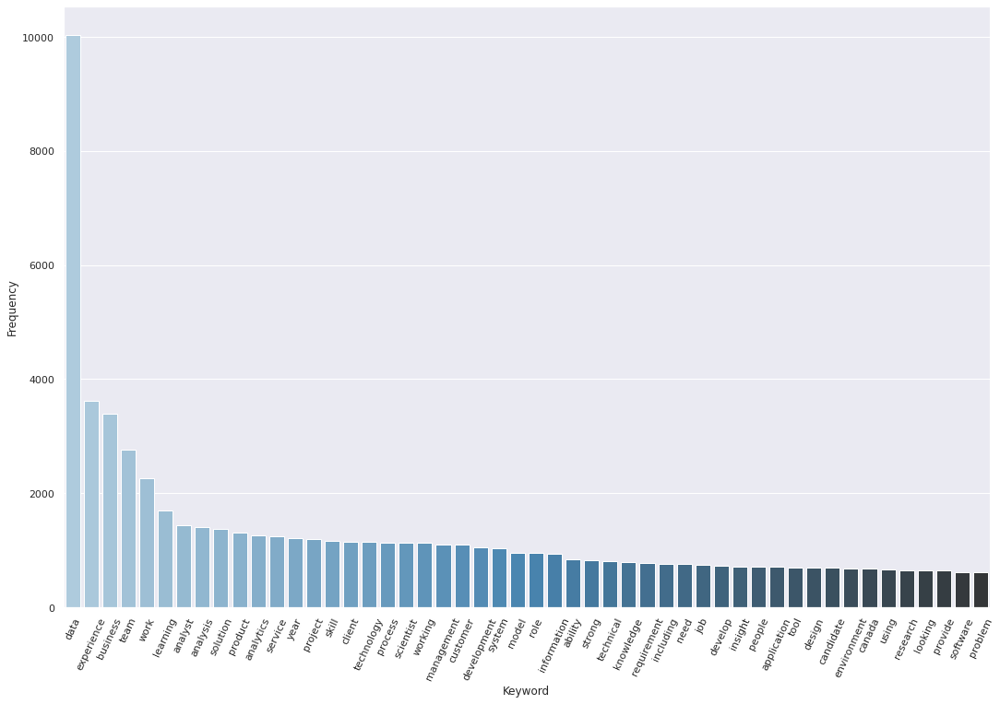

In [ ]:
# View most frequently occuring keywords
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in      
                   vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                       reverse=True)
    return words_freq[:n]

# Convert most freq words to dataframe for plotting bar plot, save as CSV
top_words = get_top_n_words(corpus, n=50)
top_df = pd.DataFrame(top_words)
top_df.columns=["Keyword", "Frequency"]
print(top_df)
#top_df.to_csv(file_prefix + '_top_words.csv')

# Barplot of most freq words
import seaborn as sns
sns.set(rc={'figure.figsize':(18,12)})
g = sns.barplot(x="Keyword", y="Frequency", data=top_df, palette="Blues_d")
g.set_xticklabels(g.get_xticklabels(), rotation=65)
#g.figure.savefig(file_prefix + "_keyword.png", bbox_inches = "tight")

               Bi-gram  Frequency
0       data scientist        908
1     business analyst        483
2      year experience        462
3       data analytics        437
4        data analysis        408
..                 ...        ...
95     product manager         78
96     functional team         77
97    skill experience         76
98  visualization tool         75
99     computer vision         74

[100 rows x 2 columns]


[Text(0, 0, 'data scientist'),
 Text(0, 0, 'business analyst'),
 Text(0, 0, 'year experience'),
 Text(0, 0, 'data analytics'),
 Text(0, 0, 'data analysis'),
 Text(0, 0, 'experience data'),
 Text(0, 0, 'data set'),
 Text(0, 0, 'big data'),
 Text(0, 0, 'experience working'),
 Text(0, 0, 'data mining'),
 Text(0, 0, 'deep learning'),
 Text(0, 0, 'data analyst'),
 Text(0, 0, 'data visualization'),
 Text(0, 0, 'work closely'),
 Text(0, 0, 'data driven'),
 Text(0, 0, 'communication skill'),
 Text(0, 0, 'data source'),
 Text(0, 0, 'team member'),
 Text(0, 0, 'data management'),
 Text(0, 0, 'job description'),
 Text(0, 0, 'data model'),
 Text(0, 0, 'learning model'),
 Text(0, 0, 'cross functional'),
 Text(0, 0, 'business intelligence'),
 Text(0, 0, 'data pipeline'),
 Text(0, 0, 'business process'),
 Text(0, 0, 'problem solving'),
 Text(0, 0, 'data engineering'),
 Text(0, 0, 'full time'),
 Text(0, 0, 'analytics data'),
 Text(0, 0, 'sexual orientation'),
 Text(0, 0, 'best practice'),
 Text(0, 0, 

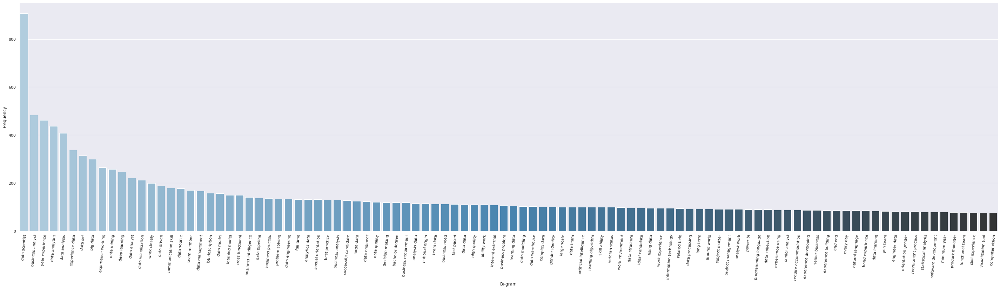

In [ ]:
# Most frequently occuring bigrams
def get_top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2),  
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

# Convert most freq bigrams to dataframe for plotting bar plot, save as CSV
top2_words = get_top_n2_words(corpus, n=100)
top2_df = pd.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Frequency"]
print(top2_df)
#top2_df.to_csv(file_prefix + '_bigrams.csv')

# Barplot of most freq Bi-grams
import seaborn as sns
sns.set(rc={'figure.figsize':(50,12)})
h=sns.barplot(x="Bi-gram", y="Frequency", data=top2_df, palette="Blues_d")
h.set_xticklabels(h.get_xticklabels(), rotation=85)
#h.figure.savefig(file_prefix + "_bi-gram.png", bbox_inches = "tight")

                         Tri-gram  Frequency
0                  large data set        102
1       sexual orientation gender         80
2            year experience data         78
3             team data scientist         77
4         senior business analyst         74
..                            ...        ...
95              data analyst data         25
96         non technical audience         25
97    diverse inclusive workplace         25
98     technical business analyst         25
99  process request accommodation         25

[100 rows x 2 columns]


[Text(0, 0, 'large data set'),
 Text(0, 0, 'sexual orientation gender'),
 Text(0, 0, 'year experience data'),
 Text(0, 0, 'team data scientist'),
 Text(0, 0, 'senior business analyst'),
 Text(0, 0, 'orientation gender identity'),
 Text(0, 0, 'cross functional team'),
 Text(0, 0, 'subject matter expert'),
 Text(0, 0, 'learning deep learning'),
 Text(0, 0, 'natural language processing'),
 Text(0, 0, 'race color religion'),
 Text(0, 0, 'problem solving skill'),
 Text(0, 0, 'engineer data scientist'),
 Text(0, 0, 'without regard race'),
 Text(0, 0, 'business system analyst'),
 Text(0, 0, 'fast paced environment'),
 Text(0, 0, 'structured unstructured data'),
 Text(0, 0, 'data analytics data'),
 Text(0, 0, 'data scientist data'),
 Text(0, 0, 'data visualization tool'),
 Text(0, 0, 'experience data analytics'),
 Text(0, 0, 'senior data scientist'),
 Text(0, 0, 'written communication skill'),
 Text(0, 0, 'protected veteran status'),
 Text(0, 0, 'complex data set'),
 Text(0, 0, 'learning artif

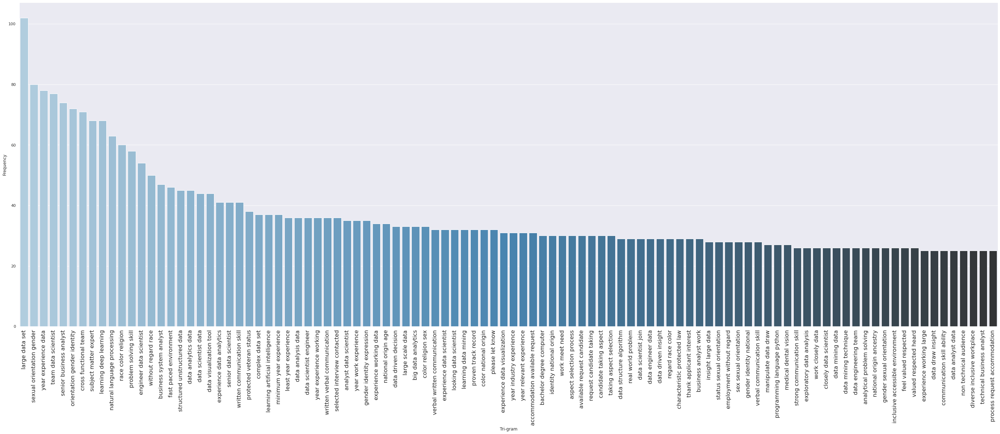

In [ ]:
# Most frequently occuring Tri-grams
def get_top_n3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(3,3), 
           max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

# Convert most freq trigrams to dataframe for plotting bar plot, save as CSV
top3_words = get_top_n3_words(corpus, n=100)
top3_df = pd.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Frequency"]
print(top3_df)
#top3_df.to_csv(file_prefix + '_trigrams.csv')

# Barplot of most freq Tri-grams
import seaborn as sns
sns.set(rc={'figure.figsize':(50,17)})
j=sns.barplot(x="Tri-gram", y="Frequency", data=top3_df, palette="Blues_d")
plt.xticks(fontsize = 16)
j.set_xticklabels(j.get_xticklabels(), rotation=90)
#j.figure.savefig(file_prefix + "_tri-gram.png", bbox_inches = "tight")

In [ ]:
L_list = ['python', 'statsmodels', 'r', 'tableau','java', 'caffe', 'apache', 'javascript', 'scala', 'c', 'php', 'sql', 'nosql', 'julia', 'lisp','hadoop','zoho', 'hpcc', 'storm', 'qubole', 'cassandra', 'statwing', 'couchdb', 'pentaho', 'flink', 'cloudera', 'kaggle', 'rapidminer', 'hive', 'tensorflow', 'pytorch', 'keras', 'pandas', 'sklearn','scikit', 'plotly', 'numpy', 'nltk', 'scipy', 'matplotlib', 'seaborn', 'statsmodels', 'scrapy', 'xgboost', 'bokeh', 'pydot', 'theano', 'matlab','django','json','spark']

In [ ]:
LangorLib = []
tool_dict = dict.fromkeys(L_list,0)
for i in range(0,len(corpus)):
  LoL = ''
  alltokens = corpus[i].split(' ')
  for token in L_list:
    if token in alltokens: 
      LoL = LoL+' '+token
      tool_dict[token] += 1
  LoL.strip()
  LangorLib.append(LoL)

In [ ]:
LangorLib

['',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 ' sql',
 '',
 '',
 ' python',
 ' matplotlib',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 ' python r sql',
 '',
 '',
 '',
 '',
 '',
 ' sql',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 ' python',
 ' python r',
 '',
 ' tableau',
 '',
 '',
 ' python r tableau',
 '',
 '',
 '',
 '',
 ' python',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 ' python r',
 ' python r scikit numpy scipy',
 '',
 '',
 '',
 '',
 '',
 ' hadoop spark',
 '',
 '',
 '',
 ' python r sql',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 ' plotly',
 '',
 '',
 ' tableau',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 ' sql',
 ' python',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 '',
 ' python',
 '',
 '',
 '',
 '',
 ' sql',
 '',
 ' python statsmodels r sklearn statsmodels',
 ' nosql hadoop',
 '',
 '',
 '',
 '',
 '',
 '',
 ' nosql hadoop',
 '',
 '',
 '',
 '',
 '',
 ' python tableau sql',
 '',
 '',
 '',
 '',
 '

In [ ]:
df['RequiredTool'] = LangorLib
df_tool = pd.DataFrame(list(tool_dict.items()),columns = ['Tool','Freq']) 
df_tool.sort_values(by='Freq',inplace=True,ascending=False)

## (3) Hierarchical Cluster Analysis

In [ ]:
import pandas as pd
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from gensim import corpora, models, similarities
from collections import defaultdict
import csv
from nltk import sent_tokenize, word_tokenize, pos_tag
import nltk
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import re
import gensim
from sklearn import manifold, datasets, decomposition, ensemble,discriminant_analysis, random_projection
from sklearn.cluster import KMeans
from matplotlib.colors import LinearSegmentedColormap
from string import punctuation
import logging
from pprint import pprint  # pretty-printer

#df= pd.read_csv('/content/Full_Job_Data_Set.csv')
df= pd.read_csv('/content/Full_Job_Data_Set_Updated_26Nov.csv')

In [ ]:
import re
import nltk

nltk.download('stopwords')
nltk.download('wordnet')

from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer

stop_words = set(stopwords.words("english"))

corpus = []
# Pre-process dataset to get a cleaned and normalised text corpus
dataset=df
datacol='Description'
corpus = []
dataset['word_count'] = dataset[datacol].apply(lambda x: len(str(x).split(" ")))
ds_count = len(dataset.word_count)

for i in range(0, ds_count):
    # Remove punctuation
    # marks, such as period, comma, and parentheses, used in writing to separate sentences and their elements and to clarify meaning.
    text = re.sub('[^a-zA-Z]', ' ', str(dataset[datacol][i]))
    
    # Convert to lowercase
    # needed for stop words to figure things out
    text = text.lower()
    #text=re.sub('c++','cplus', text)
    text=re.sub('c#','csharp', text)
    # Remove tags
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    
    # Remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    #Some keywords occur in manners not caught by the lematizer/stemmer, necessitating these replacements
    text=re.sub('(organize|organization|organisation)','organization', text)
    #text=re.sub('(mine|mining)','mining', text) - rapidmine gets changed when this happens
    text=re.sub('(team work|team working|teamwork)','team work', text)
    text=re.sub('(negotiate|negotiating)','negotiating', text)
    text=re.sub('(leadership|lead)','leadership', text) #too frequently the company is advertising themselves as leading or a 'leader', this possible instance is not included    
    text=re.sub('(clustering|cluster)','clustering', text)
    text=re.sub('(project manager|project management)','project management', text)
    text=re.sub('(communicate|communicating|communication)','communication', text)
    text=re.sub('(visualize|visualization)','visualization', text)
    #text=re.sub('(present|presentation|presenting)','presentation', text) word has no inherent context (visualize or give a presentation?)
    text=re.sub('(optimize|optimizing|optimization)','optimization', text)
    text=re.sub('(statistic|statistical analysis|statistic|statistical analysisal)','statistical analysis', text)
    text=re.sub('(business consulting|consulting)','business consulting', text)
    text=re.sub('(scikitlearn|sklearn|scikit)','sklearn', text)
    text=re.sub('(scraping|web scraping)','web scraping', text)
    text=re.sub('(pandas|panda)','panda', text)
    text=re.sub('(natural language processing|nlp|natural language)','nlp', text)
    text=re.sub('(data cleaning|preprocessing|cleaning data|clean data|data preprocessing)','data preprocessing', text)
    text=re.sub('(neural network|neural net)','neural network', text)
    # Convert to list from string
    # i guess this splits each word into a list entry
    text = text.split()
    
    # Stemming
    # Stemming is a process where words are reduced to a root by removing inflection through dropping unnecessary characters, 
    # usually a suffix. There are several stemming models, including Porter and Snowball
    ps=PorterStemmer()
    
    # Lemmatisation

    lem = WordNetLemmatizer()
    text = [lem.lemmatize(word) for word in text if not word in  
            stop_words] 
    text = " ".join(text)
    corpus.append(text)

#for i in range(0, len(df)):
  #corpus = []
  #corpus.append(df['Description'][i])
  #corpus[i] = re.sub("(\\d|\\W)+"," ",corpus[i])
  #text=re.sub("(\\d|\\W)+"," ",text) #remove any remaining special characters
  #df[col][i] = text
        #print(df[col][i])
#text=["The purpose of the current study was to examine the painful elbow, and in particular enthesitis, in psoriatic arthritis PsA and rheumatoid arthritis RA using clinical examination, ultrasonography US and magnetic resonance imaging MRI. Patients with elbow pain 11 with PsA and 9 with RA were recruited. Clinical examination, US and MRI studies were performed on the same day. For enthesitis, the common extensor and flexor insertions and the triceps insertion were imaged 20 patients, giving a total of 60 sites with comparative data. Imaging was performed with the radiologists blinded to the diagnosis and clinical findings. US was used to assess inflammatory activity Power Doppler signal, oedema, tendon thickening and bursal swelling and damage erosions, cortical roughening and enthesophytes. MRI was used to assess inflammation fluid in paratenon, peri-entheseal soft-tissue oedema, entheseal enhancement with gadolinium, entheseal oedema and bone oedema and damage erosion, cortical roughening and enthesophyte. Complete scan data were not available for all patients as one patient could not tolerate the MRI examination. No significant differences in imaging scores were found between PsA an d RA. Analysis of damage scores revealed complete agreement between US and MRI data in 43/55 78% comparisons; in 10/55 18% cases the US data were abnormal but the MRI data normal; in 2/55 4% cases, the MRI data were abnormal and the US data normal. Analysis of the inflammation scores revealed complete agreement between US and MRI data in 33/55 60% comparisons; in 3/55 5% cases US data were abnormal but MRI data normal; in 19/55 35% cases the MRI data were abnormal and the US data normal. There was a poor relationship between assessments based on clinical examination and imaging studies. Readers could not accurately identify the disease from imaging findings."]

corpus

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


['experienced data scientist use advanced data analysis technique recommend improvement across company activity',
 'help support buzz radar product roadmap helping data analyst research new data source latest analysis technique',
 'important part data science extracting transforming loading data requires excellent programming scripting skill',
 'strong working knowledge machine learning model data mining role created support development innovation develop explore new',
 'using data science analytics variety analytical statistical machine learning technique interpret client data helping make better',
 'mean detecting pattern anomaly data working either upstream intelligence observation financial crime investigator directly',
 'job overview expiration date nd june location london job title data scientist team lead salary',
 'employ staff full time equivalent mostly scientist researcher public health professional responsible improving health',
 'data scientist raman spectroscopy across ha

In [ ]:

vec = CountVectorizer(token_pattern = r"(?u)\b\w+\b", ngram_range=(1,2), max_features=100966) #be wary of RAM size, works on Colab
matrix = vec.fit_transform(corpus)
what = pd.DataFrame(matrix.toarray(), columns=vec.get_feature_names())


In [ ]:
what.head()

,aa,aa blue,aa f,aa raventek,aa supervis,aaa,aaa multiplayer,aaarl,aaarl help,aapoon,aapoon digital,aapsjob,aapsjob title,ab,ab apply,ab calgary,ab canada,ab edmonton,ab initio,ab major,ab member,ab month,ab network,ab november,ab ove,ab p,ab quarterly,ab role,ab seeking,ab toronto,ab yyc,abac,abac data,abap,abap bi,abap development,abap hand,abap proxy,abap user,abap webdynpro,...,zip gotta,zlmt,zlmt eoe,zombie,zombie come,zone,zone cape,zone connects,zone data,zone deliverable,zone eastern,zone leading,zone provincial,zone responsible,zone strong,zoom,zoom est,zoom go,zoom growing,zoom however,zoom requires,zoom rule,zoom success,zoom surfacing,zurich,zurich data,zybooks,zybooks platform,zynga,zynga consider,zynga data,zynga equal,zynga game,zynga leading,zynga poker,zynga provides,zynga stock,zynga zynga,zzz,zzz temporary
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Software Libraries  go into softlib
'''
           Words of interest came from datacamp results and the following links
           https://www.edureka.co/blog/machine-learning-libraries/
           https://medium.com/@ODSC/top-7-machine-learning-frameworks-for-2020-7e45164914e1
           https://www.cio.com/article/3263790/the-essential-skills-and-traits-of-an-expert-data-scientist.html
           https://medium.com/@ODSC/top-data-science-skills-for-2020-34c2a9d2fc25
           https://www.indeed.com/career-advice/resumes-cover-letters/computer-coding-skills

#data is a stop word, avoid terms like - 'big data', 'deep learning', 'data mining', 'data mining', data management', ''data storytelling', 'data pipeline', 'research', 'data engineering', team, etc.
These key words will not capture all the trends and relationships in the data, so the main purpose of generating this dendrogram
is to validate what topics are important for our desired curriculum, rather than to use the dendrogram
to find the most important relationships - to do so would be circular in logic and reasoning
'''

softlib = ['panda',  'impala', 'hadoop', 'qubole', 'cassandra', 'apache', 'git', 'sklearn', 'tableau',
           'cloudera','hive', 'tensorflow', 'pytorch', 'azure', 'aws',
           'plotly', 'numpy', 'nltk', 'scipy', 'matplotlib', 'seaborn', 'statsmodels', 'scrapy', 'theano','django']  #'excel' - both a software and a verb, had to be removed for this reason

#langauges go into langlist

langlist = ['python', 'r', 'java', 'javascript', 'scala', 'c', 'php', 'sql', 'spark',
            'julia','nosql',  'storm',  'matlab', 'ruby']

#Skills go into list


skills_list = ['communication', 'mining', 'cloud computing', 'clustering',
                'statistical analysis', 'project management', 'business consulting',
                'negotiation',  'web development', 'leadership', 'organization', 
               'risk analysis', 'presentation', 'time series', 'preprocessing',
                  'optimization',  'nlp', 'neural network',  'team work']

#The Dendrogram will not capture all relationships/clusters/complexity, but it
#is an important validation tool to decide what can be used to 

'''
WHY DO IT LIKE THIS?
These skills occur at differing frequencies - the scraped data favours general terms rather than specific skills (coding libraries and languages)
Therefore, it was decided to make 3 lists for coding languages, software libraries, and general skills based on keywords extracted
from DataCamp, Job websites, or researched from generic sources (links provided at top of cell)
This method captures more complexity than simply taking the top 30 most frequent keywords, though it is slightly biased
This method is not perfect, nor does it capture all possible relationships, but it is a satisfactory means of exploratory data analysis
that can help justify what to include together in certain courses based on the clusters formed in the dendrogram
'''

In [ ]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

def get_hi(L_list, what):
  hi = pd.DataFrame()
  working_list = L_list
  hi = what[working_list]
  return hi


###Seperate Attempt at Dendogram
#hi.head()
def get_dendrogram(hi):
  hi_T = hi.T

  #I'm a dummy
  dummy = hi_T.copy(deep = True)

  #plt.figure(figsize = (12,8))
  #dend = shc.dendrogram(shc.linkage(data_scaled, method=‘ward’))
  den = shc.dendrogram(shc.linkage(dummy, method='ward'), orientation = 'right',
  labels = dummy.index)
  return den

In [ ]:
softlib_df = get_hi(softlib, what)
softlib_df.head()
a=softlib_df.sum().sort_values(ascending=False).index
softlib_df=softlib_df.reindex(columns=a)
softlib_df.iloc[:5,:10]

,tableau,aws,hadoop,azure,tensorflow,hive,sklearn,panda,pytorch,numpy
0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0


In [ ]:
skills_df = get_hi(skills_list, what)
skills_df.head()

a=skills_df.sum().sort_values(ascending=False).index
skills_df=skills_df.reindex(columns=a)
skills_df.iloc[:5,:15]

,communication,organization,statistic,leadership,data mining,business consulting,nlp,optimization,project management,statistical analysis,neural network,time series,cloud computing,critical thinking,cluster
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
lang_df = get_hi(langlist, what)
lang_df.head()
a=lang_df.sum().sort_values(ascending=False).index
lang_df=lang_df.reindex(columns=a)
lang_df.iloc[:5,:10]

,r,python,sql,c,spark,java,scala,nosql,matlab,javascript
0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0


In [ ]:
code_table = pd.DataFrame()
gen_table = pd.DataFrame()

list1 = skills_df.columns[:15].tolist()
#print(list1)
list2 = lang_df.columns[:10].tolist()
#print(list2)
list3 = softlib_df.columns[:10].tolist()
#print(list3)

list_code = list3 + list2
list_gen = list1

code_table = get_hi(list_code, what)
gen_table = get_hi(list_gen, what)


In [ ]:
code_table.head()

,tableau,aws,hadoop,azure,tensorflow,hive,sklearn,panda,pytorch,numpy,r,python,sql,c,spark,java,scala,nosql,matlab,javascript
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


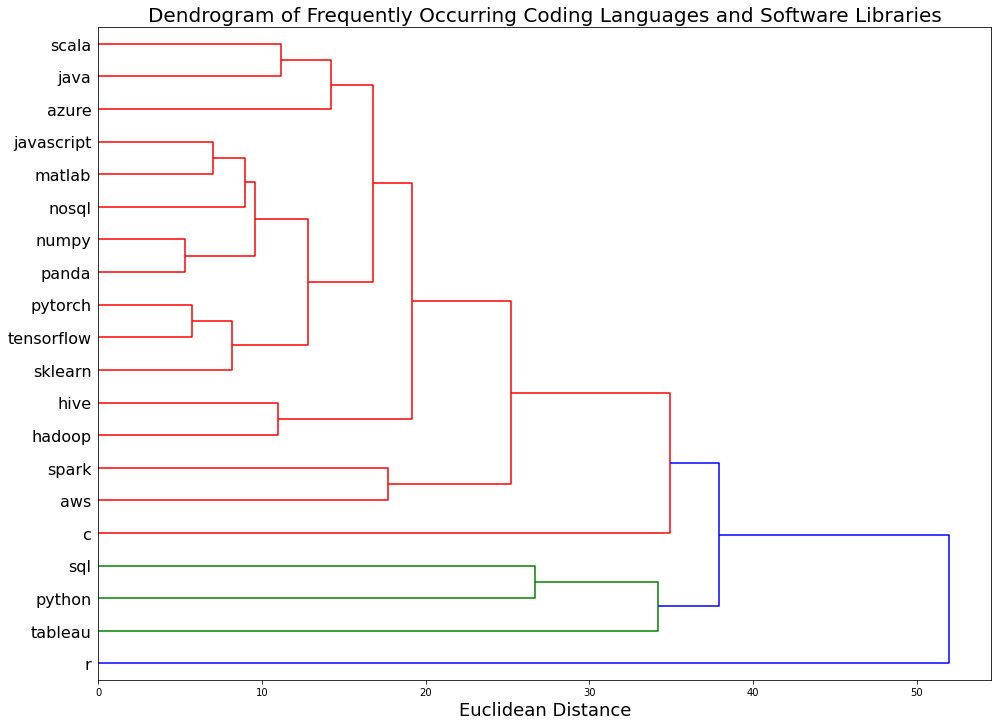

In [ ]:
plt.figure(figsize = (16,12))
oh_no = get_dendrogram(code_table)
plt.xlabel('Euclidean Distance', fontsize = 18)
plt.yticks(fontsize = 16)
plt.title('Dendrogram of Frequently Occurring Coding Languages and Software Libraries', fontsize = 20)
#plt.axvline(x = 36, color='r', linestyle='--') #this dendrogram is informative for specific coding skills, but not so much for general skills
plt.show()

In [ ]:
gen_table.head()

,communication,organization,statistic,leadership,data mining,business consulting,nlp,optimization,project management,statistical analysis,neural network,time series,cloud computing,critical thinking,cluster
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


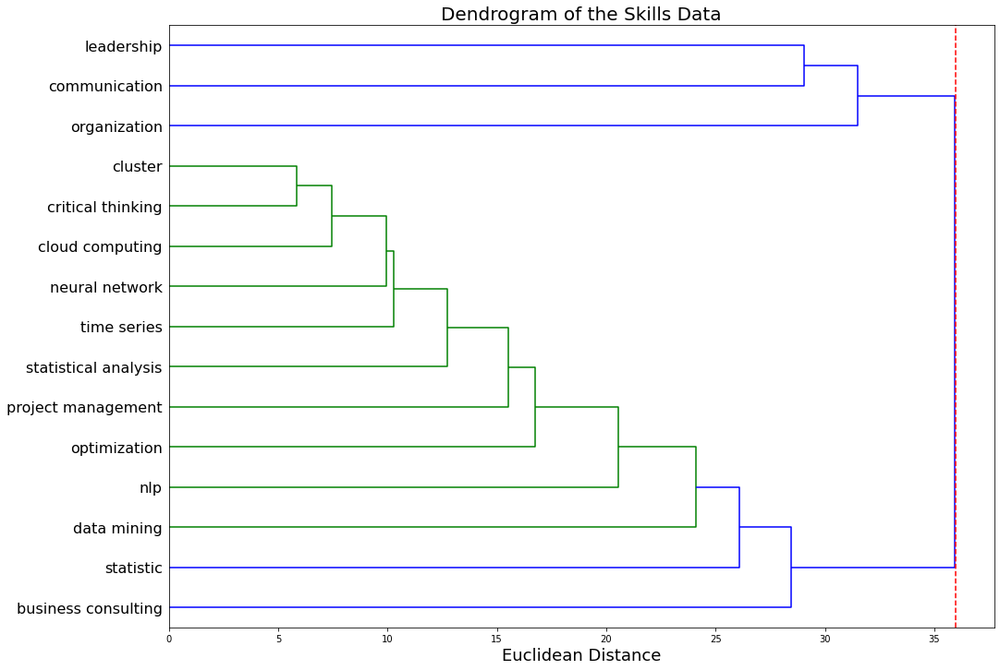

In [ ]:
plt.figure(figsize = (16,12))
oh_no = get_dendrogram(gen_table)
plt.xlabel('Euclidean Distance', fontsize = 18)
plt.yticks(fontsize = 16)
plt.title('Dendrogram of the Skills Data', fontsize = 20)
plt.axvline(x = 36, color='r', linestyle='--') #this dendrogram is not very informative, regardless of where the line is drawn
plt.show()

In [ ]:
full_table = pd.DataFrame()

list_tot = list_code + list_gen
full_table = get_hi(list_tot, what)
full_table.head()

,tableau,aws,hadoop,azure,tensorflow,hive,sklearn,panda,pytorch,numpy,r,python,sql,c,spark,java,scala,nosql,matlab,javascript,communication,organization,statistic,leadership,data mining,business consulting,nlp,optimization,project management,statistical analysis,neural network,time series,cloud computing,critical thinking,cluster
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


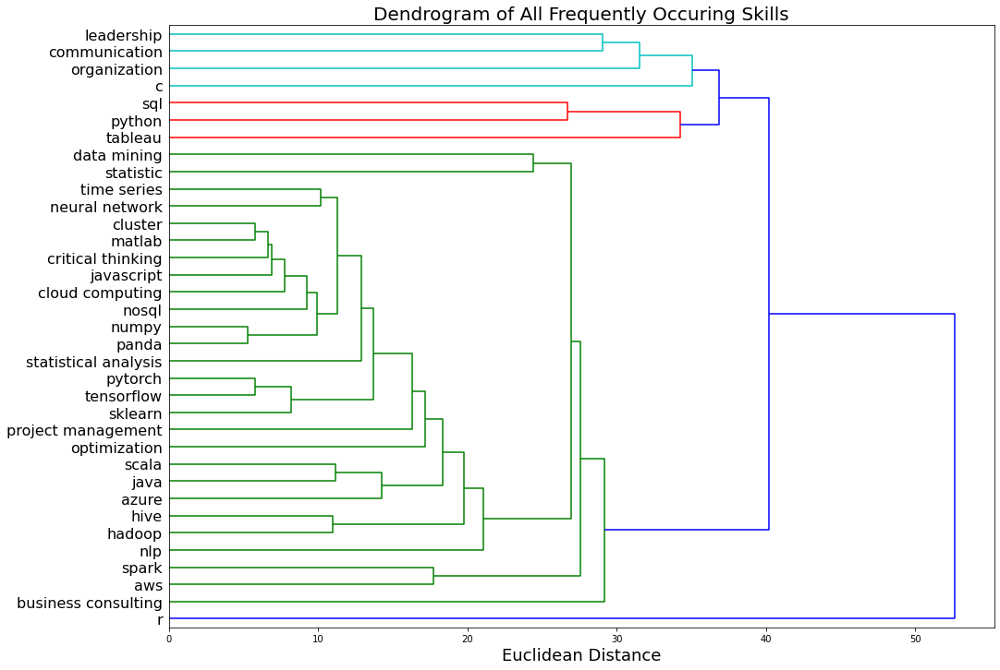

In [ ]:
plt.figure(figsize = (16,12))
oh_no = get_dendrogram(full_table)
plt.xlabel('Euclidean Distance', fontsize = 18)
plt.yticks(fontsize = 16)
plt.title('Dendrogram of All Frequently Occuring Skills', fontsize = 20)
#plt.axvline(x = 38, color='r', linestyle='--') #this dendrogram is the most informative but also is the least readable.
plt.show()

## (4) Latent Dirichlet Allocation Analysis for the diagnostic device

In [ ]:
!pip install gensim

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation

In [ ]:
lda_model = LatentDirichletAllocation(n_components =4)
lda_output = lda_model.fit_transform(X)

In [ ]:
df_topic_keywords = pd.DataFrame(lda_model.components_)
df_topic_keywords.columns = cv.get_feature_names()
topicnames = ["Topic" + str(i) for i in range(lda_model.n_components)]
df_topic_keywords.index = topicnames
df_topic_keywords.head()

,communication,visualization software,cloud computing,statistical analysis,project management,business consulting,visualization,creativity,negotiation,web development,...,hadoop,qubole,cassandra,pentaho,cloudera,rapidminer,hive,azure,aws,plotly
Topic0,6.552365,0.250090,8.062032,0.254339,0.257153,0.250152,0.257705,0.268031,0.252565,0.250078,...,114.233701,1.001080,13.246580,0.257267,5.241532,0.252129,59.241748,68.231654,133.228384,0.252468
Topic1,2.880396,0.257398,0.456028,78.234776,0.254710,0.290940,0.254975,16.073928,5.239836,3.212296,...,0.253293,0.269739,0.250792,0.292759,0.254560,2.246664,0.255204,0.254296,0.253829,2.331315
Topic2,47.837908,0.250130,18.227695,0.254207,39.628701,0.259549,0.254418,6.295583,0.251895,0.276878,...,0.251749,0.479086,0.251442,0.250091,0.253833,0.251134,0.250869,0.254912,0.257002,0.297475
Topic3,261.729332,3.242382,0.254245,0.256678,23.859436,2.199359,322.232903,0.362459,0.255705,0.260748,...,0.261257,0.250095,0.251186,1.199882,0.250074,0.250073,0.252178,0.259138,0.260785,2.118742


In [ ]:
# Show top n keywords for each topic
def show_topics(vectorizer, lda_model, n_words):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords
topic_keywords = show_topics(vectorizer=cv, lda_model=lda_model, n_words=10)
# Topic - Keywords Dataframe
df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Skill '+str(i) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords.transpose()
#df_topic_keywords

,Topic 0,Topic 1,Topic 2,Topic 3
Skill 0,python,optimization,organization,visualization
Skill 1,sql,nlp,python,communication
Skill 2,spark,statistical analysis,software development,sql
Skill 3,aws,simulation,leadership,tableau
Skill 4,hadoop,critical thinking,communication,python
Skill 5,leadership,creativity,tensorflow,leadership
Skill 6,java,preprocessing,project management,project management
Skill 7,azure,matlab,panda,javascript
Skill 8,scala,python,numpy,visualization software
Skill 9,hive,leadership,pytorch,business consulting


In [ ]:
Topics= ['Big data engineer', 'Data analyst / scientist', 'Business analysst', 'Data visualization specialist']
df_topic_keywords =df_topic_keywords.rename(index = {'Topic 0':'Big data engineer','Topic 1':'Data analyst / scientist','Topic 2':'Business analyst',
                                  'Topic 3':'Data visualization specialist'})
df_topic_keywords.transpose()

,Big data engineer,Data analyst / scientist,Business analyst,Data visualization specialist
Skill 0,python,optimization,organization,visualization
Skill 1,sql,nlp,python,communication
Skill 2,spark,statistical analysis,software development,sql
Skill 3,aws,simulation,leadership,tableau
Skill 4,hadoop,critical thinking,communication,python
Skill 5,leadership,creativity,tensorflow,leadership
Skill 6,java,preprocessing,project management,project management
Skill 7,azure,matlab,panda,javascript
Skill 8,scala,python,numpy,visualization software
Skill 9,hive,leadership,pytorch,business consulting


In [ ]:
def predict_topic(inputtext):
# Step 1: Clean with simple_preprocess
   # marks, such as period, comma, and parentheses, used in writing to separate sentences and their elements and to clarify meaning.
    text = re.sub('[^a-zA-Z]', ' ',inputtext)
    
    # Convert to lowercase
    # needed for stop words to figure things out
    text = text.lower()
    
    # Remove tags
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    
    # Remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    # Convert to list from string
    # i guess this splits each word into a list entry
    text = text.split()
    
# Step 2: Lemmatize
    lem = WordNetLemmatizer()
    mytext_3 =[lem.lemmatize(word) for word in text if not word in stop_words] 
    text = " ".join(text)
# Step 3: Vectorize transform
    mytext_4 = cv.transform(mytext_3)
    # use skill set vocabulary to find input skills name
    input_skills = mytext_4.toarray().nonzero()[1]
    your_skills = set()
    for skill_index in input_skills:
        your_skills.add(skills_list[skill_index])
# Step 4: LDA Transform
    topic_probability_scores = lda_model.transform(mytext_4)
    # add up scores for the input of each topic
    topic_probability_scores =topic_probability_scores.sum(axis=0)
    # Step 5: Infer Topic - the highest score 
    best_index = np.argmax(topic_probability_scores)
    infer_topic = Topics[best_index]
    skillset = set(df_topic_keywords.iloc[best_index].values)
    # return in
    return infer_topic, skillset - your_skills

In [ ]:
text = "I know python, sql and good at project management"
infer_topic, missing_skills = predict_topic(text)
print("Your skills matche {}, the skills your still need to learn are {}".format(infer_topic, missing_skills))

Your skills matche Data visualization specialist, the skills your still need to learn are {'visualization', 'tableau', 'javascript', 'leadership', 'communication', 'project management', 'business consulting', 'visualization software'}
